In [1]:
import sys
sys.path.append('..')

import os
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import gaussian, threshold_otsu
from skimage.transform import resize
from skimage import io
import pickle
from skimage.measure import regionprops

import matplotlib.pyplot as plt
import torch
import time
import model.model_cnnvae_conditional
import model.optimizer as optimizer
from sklearn.decomposition import PCA
import pandas as pd

In [2]:
sharedSizes=[128]
dSpecific_filter=[(16,8)]
pID_type='randInit'
pIDemb_size=64

In [3]:
holdOutSamples=['HV1','P22','P14','P27']

In [4]:
sourceDir='/data/xinyi/c2p/data/chromark'
segDir=os.path.join(sourceDir,'nuclear_masks')
imgDir=os.path.join(sourceDir,'raw_data')
conditions=['controls','headneck','meningioma', 'glioma']

outSize=128
savename='pathCentered_'+str(outSize)

imgsC_all=None
imgsP_all=None
imgNames_all=None
proteinNames=None
pID_all=None
for condition_i in conditions:
    print(condition_i)
    segDir_i=os.path.join(segDir,condition_i)
    imgDir_i=os.path.join(imgDir,condition_i)
    for stain in os.listdir(segDir_i):
        print(stain)
        segDir_i_stain=os.path.join(segDir_i,stain)
        imgDir_i_stain=os.path.join(imgDir_i,stain)
        
        segPID2name={}
        for pID_dir in os.listdir(segDir_i_stain):
            pID=pID_dir.split('_')
            segPID2name[pID[0]]=pID_dir
        imgPID2name={}
        for pID_dir in os.listdir(imgDir_i_stain):
            pID=pID_dir.split('_')
            imgPID2name[pID[0]]=pID_dir
        for pID in segPID2name.keys():
            if condition_i=='meningioma' and stain=='dapi_gh2ax_lamin_cd3' and pID=='P33': #skipping incorrect images
                continue
            if pID in holdOutSamples:
                print('hold out: '+pID)
                continue
            print(pID)
            if pID not in imgPID2name:
                print('img not found '+pID)
                continue
            imgDir_i_stain_p=os.path.join(imgDir_i_stain,imgPID2name[pID])
            segDir_i_stain_p=os.path.join(segDir_i_stain,segPID2name[pID])
            
            with open(os.path.join(imgDir_i_stain_p,savename+'_imgNames'), 'rb') as output:
                imgNames=pickle.load(output)
            with open(os.path.join(imgDir_i_stain_p,savename+'_img'), 'rb') as output:
                img=pickle.load(output)

            imgP=np.zeros((img.shape[0],1,img.shape[2],img.shape[3]))
            proteinNames_curr=np.array([])
            stain_list=stain.split('_')
            nImgPerStain=int(img.shape[0]/(len(stain_list)-1))
            np.random.seed(3)
            allIdx_all=np.arange(img.shape[0])
            np.random.shuffle(allIdx_all)
            for s in range(1,len(stain_list)):
                s_start=(s-1)*nImgPerStain
                if s==len(stain_list)-1:
                    s_end=img.shape[0]
                else:
                    s_end=s*nImgPerStain
                imgP[s_start:s_end]=img[allIdx_all[s_start:s_end],s].reshape(s_end-s_start,1,img.shape[2],img.shape[3])
                proteinNames_curr=np.concatenate((proteinNames_curr,np.repeat(stain_list[s],s_end-s_start)))
            
            if pID_all is None:
                pID_all=np.repeat(pID,img.shape[0])
                imgsC_all=img[allIdx_all,[0]]
                imgNames_all=imgNames[allIdx_all]
                proteinNames=proteinNames_curr
                imgsP_all=imgP
            else:
                pID_all=np.concatenate((pID_all,np.repeat(pID,img.shape[0])))
                imgsC_all=np.concatenate((imgsC_all,img[allIdx_all,[0]]),axis=0)
                imgNames_all=np.concatenate((imgNames_all,imgNames[allIdx_all]))
                proteinNames=np.concatenate((proteinNames,proteinNames_curr))
                imgsP_all=np.concatenate((imgsP_all,imgP),axis=0)
imgsC_all=imgsC_all.reshape(imgsC_all.shape[0],1,imgsC_all.shape[1],imgsC_all.shape[2])

controls
dapi_gh2ax_lamin
HV5
HV4
HV2
HV10
hold out: HV1
HV7
HV9
HV8
HV3
HV6
dapi_cd8_cd4
hold out: HV1
HV8
HV6
HV7
HV4
HV5
HV3
HV2
headneck
dapi_gh2ax_lamin_cd3
P72
P63
hold out: P14
P44
P41
P56
P18
P55
P50
P24
dapi_cd16_cd4_cd8
P55
P56
P72
hold out: P14
P18
P41
P44
P63
P50
P24
meningioma
dapi_gh2ax_lamin_cd3
hold out: P27
P70
P83
P42
P59
P38
P48
P37
P62
dapi_cd16_cd4_cd8
P42
P48
P62
P38
P83
P37
P33
P70
P59
hold out: P27
glioma
dapi_gh2ax_lamin_cd3
P46
P16
P52
hold out: P22
P84
P47
P57
P15
P29
img not found P29
P68
dapi_cd16_cd4_cd8
P46
P47
P29
P52
P57
hold out: P22
P68
P16
P84
P15


In [5]:
imgsC_all.shape

(29174, 1, 128, 128)

In [6]:
nProt=np.unique(proteinNames).size
pnames,revIdx,pCounts=np.unique(proteinNames,return_inverse=True,return_counts=True)
plabels=torch.tensor(np.arange(pnames.size)[revIdx]).long()

In [7]:
os.environ["CUDA_VISIBLE_DEVICES"] = "7"
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"


In [8]:
#VAE settings
seed=3
epochs=5001
saveFreq=100
lr_latent=0.001 #initial learning rate
lr_decoder=0.0001
weight_decay=0 #Weight for L2 loss on embedding matrix.

# batchsize=4
batchsize=256
kernel_size=4
stride=2
padding=1

# fc_dim1=6000
hidden1=64 #Number of channels in hidden layer 1
hidden2=128 
hidden3=256
hidden4=256
hidden5=96
hidden5_xy=4
fc_dim1=96*hidden5_xy*hidden5_xy
fc_dim2=6000

dropout=0.01
kl_weight=0.0000001





In [9]:
printFreq=1
trainIdx=np.arange(imgsC_all.shape[0])
def train(epoch):
    t = time.time()
    modelcnn_dna.train()
    modelcnn_protein.train()
    modelcnn_dnaShared.train()
    modelcnn_pShared.train()

    loss_x_train_all_dna=0
    loss_x_trainShared_all_dna=0
    loss_x_train_all_protein=0
    loss_x_trainShared_all_protein=0
    loss_lNorm_all=0
    loss_lNorm_all_dna=0
    loss_lNorm_all_protein=0
    loss_all=0
    ntrainBatches=int(np.ceil(trainIdx.shape[0]/batchsize))
    for i in range(ntrainBatches):
#         if i%200==0:
#         print(i)
        trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
        traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
        traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
        trainIdx_i=torch.tensor(trainIdx_i)
        trainInput_ID=plabels[trainIdx_i].cuda()
        trainInput_shared=latent_shared(trainIdx_i).cuda().float()
        trainInput_dna=latent_dna(trainIdx_i).cuda().float()
        trainInput_protein=latent_protein(trainIdx_i).cuda().float()
        if addNoise:
            trainInput_shared=trainInput_shared+torch.randn_like(trainInput_shared)
            trainInput_dna=trainInput_dna+torch.randn_like(trainInput_dna)
            trainInput_protein=trainInput_protein+torch.randn_like(trainInput_protein)
#         print(trainInput.shape)

        optimizer_dna.zero_grad()
        optimizer_protein.zero_grad()
        optimizer_dnaShared.zero_grad()
        optimizer_pShared.zero_grad()
        optimizer_latent.zero_grad()

        recon_dna= modelcnn_dna(torch.cat((trainInput_shared,trainInput_dna),dim=1),pIDemb(trainInput_ID))
        reconShared_dna=modelcnn_dnaShared(trainInput_shared,pIDemb(trainInput_ID))
        recon_protein= modelcnn_protein(torch.cat((trainInput_shared,trainInput_protein),dim=1),pIDemb(trainInput_ID))
        reconShared_protein=modelcnn_pShared(trainInput_shared,pIDemb(trainInput_ID))
        
        loss_x_train_protein=loss_x(recon_protein, traintarget_protein)
        loss_xShared_train_protein=loss_x(reconShared_protein,traintarget_protein)
        loss_x_train_dna=loss_x(recon_dna, traintarget_dna)
        loss_xShared_train_dna=loss_x(reconShared_dna,traintarget_dna)
        
        loss=loss_x_train_protein+loss_xShared_train_protein+loss_x_train_dna+loss_xShared_train_dna
        if addNoise:
            loss_lNorm=torch.mean(torch.linalg.norm(latent_shared(trainIdx_i).cuda(),dim=1))/latent_shared.embedding_dim
            loss_lNorm_all+=loss_lNorm.item()
            loss+=loss_lNorm*actDecay
            
            loss_lNorm_dna=torch.mean(torch.linalg.norm(latent_dna(trainIdx_i).cuda(),dim=1))/latent_dna.embedding_dim
            loss_lNorm_all_dna+=loss_lNorm_dna.item()
            loss+=loss_lNorm_dna*actDecay
            
            loss_lNorm_protein=torch.mean(torch.linalg.norm(latent_protein(trainIdx_i).cuda(),dim=1))/latent_protein.embedding_dim
            loss_lNorm_all_protein+=loss_lNorm_protein.item()
            loss+=loss_lNorm_protein*actDecay
        
        loss_x_train_all_dna+=loss_x_train_dna.item()
        loss_x_trainShared_all_dna+=loss_xShared_train_dna.item()
        loss_x_train_all_protein+=loss_x_train_protein.item()
        loss_x_trainShared_all_protein+=loss_xShared_train_protein.item()
        loss_all+=loss.item()
        
        loss.backward()
        optimizer_dna.step()
        optimizer_dnaShared.step()
        optimizer_protein.step()
        optimizer_pShared.step()
        optimizer_latent.step()


    loss_x_train_all_dna=loss_x_train_all_dna/ntrainBatches
    loss_x_trainShared_all_dna=loss_x_trainShared_all_dna/ntrainBatches
    loss_x_train_all_protein=loss_x_train_all_protein/ntrainBatches
    loss_x_trainShared_all_protein=loss_x_trainShared_all_protein/ntrainBatches
    loss_all=loss_all/ntrainBatches
    if addNoise:
        loss_lNorm_all=loss_lNorm_all/ntrainBatches
        loss_lNorm_all_dna=loss_lNorm_all_dna/ntrainBatches
        loss_lNorm_all_protein=loss_lNorm_all_protein/ntrainBatches

#     with torch.no_grad():
#         modelcnn_dna.eval()
#         modelcnn_protein.eval()
#         modelcnn_dnaShared.eval()
#         modelcnn_pShared.eval()



#         loss_val_all=0
#         loss_x_val_all_dna=0
#         loss_x_valShared_all_dna=0
#         loss_x_val_all_protein=0
#         loss_x_valShared_all_protein=0
#         nvalBatches=int(np.ceil(valIdx.shape[0]/batchsize))
#         for i in range(nvalBatches):
#             valIdx_i=valIdx[i*batchsize:min((i+1)*batchsize,valIdx.shape[0])]
#             valtarget_protein=torch.tensor(imgsP_all[valIdx_i]).cuda().float()
#             valtarget_dna=torch.tensor(imgsC_all[valIdx_i]).cuda().float()
#             valInput_ID=plabels[valIdx_i].cuda()
#             valIdx_i=torch.tensor(valIdx_i)
#             valInput_shared=latent_shared(valIdx_i).cuda().float()
#             valInput_dna=latent_dna(valIdx_i).cuda().float()
#             valInput_protein=latent_protein(valIdx_i).cuda().float()

#             recon_dna= modelcnn_dna(torch.cat((valInput_shared,valInput_dna),dim=1),pIDemb(valInput_ID))
#             reconShared_dna=modelcnn_dnaShared(valInput_shared,pIDemb(valInput_ID))
#             recon_protein= modelcnn_protein(torch.cat((valInput_shared,valInput_protein),dim=1),pIDemb(valInput_ID))
#             reconShared_protein=modelcnn_pShared(valInput_shared,pIDemb(valInput_ID))



#             loss_x_val_protein=loss_x(recon_protein, valtarget_protein)
#             loss_xShared_val_protein=loss_x(reconShared_protein,valtarget_protein)
#             loss_x_val_dna=loss_x(recon_dna, valtarget_dna)
#             loss_xShared_val_dna=loss_x(reconShared_dna,valtarget_dna)

#             loss=loss_x_val_protein+loss_xShared_val_protein+loss_x_val_dna+loss_xShared_val_dna

#             loss_x_val_all_dna+=loss_x_val_dna.item()
#             loss_x_valShared_all_dna+=loss_xShared_val_dna.item()
#             loss_x_val_all_protein+=loss_x_val_protein.item()
#             loss_x_valShared_all_protein+=loss_xShared_val_protein.item()
#             loss_val_all+=loss.item()

#         loss_x_val_all_dna=loss_x_val_all_dna/nvalBatches
#         loss_x_valShared_all_dna=loss_x_valShared_all_dna/nvalBatches
#         loss_x_val_all_protein=loss_x_val_all_protein/nvalBatches
#         loss_x_valShared_all_protein=loss_x_valShared_all_protein/nvalBatches
#         loss_val_all=loss_val_all/nvalBatches



    if epoch%printFreq==0:
        print('Epoch: {:04d}'.format(epoch),
              'loss_train: {:.4f}'.format(loss_all),
              'loss_x_train_dna: {:.4f}'.format(loss_x_train_all_dna),
              'loss_x_train_protein: {:.4f}'.format(loss_x_train_all_protein),
              'loss_xShared_train_dna: {:.4f}'.format(loss_x_trainShared_all_dna),
              'loss_xShared_train_protein: {:.4f}'.format(loss_x_trainShared_all_protein),
              'time: {:.4f}s'.format(time.time() - t))
    return loss_all,loss_x_train_all_dna,loss_x_train_all_protein,loss_x_trainShared_all_dna,loss_x_trainShared_all_protein,loss_lNorm_all,loss_lNorm_all_dna,loss_lNorm_all_protein

In [10]:
i=0
trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
torch.tensor(imgsC_all[trainIdx_i]).shape

torch.Size([256, 1, 128, 128])

In [11]:
match_weight=1
sharedWeight=1
addNoise=True
actDecay=0.001
name_train='splitChannels_conditional_lord_withNoise_bce'
modelname_train='cnn_vae_pbmc_lord'
logsavepath_train=os.path.join('/data/xinyi/c2p/log/',modelname_train,name_train)
modelsavepath_train=os.path.join('/data/xinyi/c2p/models/',modelname_train,name_train)
plotsavepath_train=os.path.join('/data/xinyi/c2p/plots/',modelname_train,name_train)

if not os.path.exists(os.path.join('/data/xinyi/c2p/log/',modelname_train)):
    os.mkdir(os.path.join('/data/xinyi/c2p/log/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/models/',modelname_train))
    os.mkdir(os.path.join('/data/xinyi/c2p/plots/',modelname_train))
if not os.path.exists(logsavepath_train):
    os.mkdir(logsavepath_train)
    os.mkdir(os.path.join(logsavepath_train,'dna'))
    os.mkdir(os.path.join(logsavepath_train,'protein'))
if not os.path.exists(modelsavepath_train):
    os.mkdir(modelsavepath_train)
    os.mkdir(os.path.join(modelsavepath_train,'dna'))
    os.mkdir(os.path.join(modelsavepath_train,'protein'))
if not os.path.exists(plotsavepath_train):
    os.mkdir(plotsavepath_train)
    os.mkdir(os.path.join(plotsavepath_train,'dna'))
    os.mkdir(os.path.join(plotsavepath_train,'protein'))




128
16
Epoch: 0000 loss_train: 1.8188 loss_x_train_dna: 0.5790 loss_x_train_protein: 0.4226 loss_xShared_train_dna: 0.4942 loss_xShared_train_protein: 0.3225 time: 40.5874s
Epoch: 0001 loss_train: 1.1732 loss_x_train_dna: 0.3777 loss_x_train_protein: 0.2374 loss_xShared_train_dna: 0.3484 loss_xShared_train_protein: 0.2091 time: 40.2616s
Epoch: 0002 loss_train: 1.0673 loss_x_train_dna: 0.3417 loss_x_train_protein: 0.2044 loss_xShared_train_dna: 0.3290 loss_xShared_train_protein: 0.1917 time: 36.0407s
Epoch: 0003 loss_train: 1.0323 loss_x_train_dna: 0.3295 loss_x_train_protein: 0.1920 loss_xShared_train_dna: 0.3238 loss_xShared_train_protein: 0.1864 time: 33.2057s
Epoch: 0004 loss_train: 1.0192 loss_x_train_dna: 0.3247 loss_x_train_protein: 0.1872 loss_xShared_train_dna: 0.3222 loss_xShared_train_protein: 0.1845 time: 32.5445s
Epoch: 0005 loss_train: 1.0137 loss_x_train_dna: 0.3227 loss_x_train_protein: 0.1850 loss_xShared_train_dna: 0.3218 loss_xShared_train_protein: 0.1836 time: 32.836

Epoch: 0050 loss_train: 0.9479 loss_x_train_dna: 0.3087 loss_x_train_protein: 0.1642 loss_xShared_train_dna: 0.3098 loss_xShared_train_protein: 0.1646 time: 33.9217s
Epoch: 0051 loss_train: 0.9471 loss_x_train_dna: 0.3084 loss_x_train_protein: 0.1641 loss_xShared_train_dna: 0.3095 loss_xShared_train_protein: 0.1645 time: 29.9390s
Epoch: 0052 loss_train: 0.9462 loss_x_train_dna: 0.3081 loss_x_train_protein: 0.1639 loss_xShared_train_dna: 0.3092 loss_xShared_train_protein: 0.1644 time: 28.5522s
Epoch: 0053 loss_train: 0.9453 loss_x_train_dna: 0.3078 loss_x_train_protein: 0.1638 loss_xShared_train_dna: 0.3089 loss_xShared_train_protein: 0.1643 time: 31.4774s
Epoch: 0054 loss_train: 0.9441 loss_x_train_dna: 0.3074 loss_x_train_protein: 0.1636 loss_xShared_train_dna: 0.3086 loss_xShared_train_protein: 0.1640 time: 29.0559s
Epoch: 0055 loss_train: 0.9436 loss_x_train_dna: 0.3072 loss_x_train_protein: 0.1635 loss_xShared_train_dna: 0.3084 loss_xShared_train_protein: 0.1639 time: 32.2326s
Epoc

Epoch: 0103 loss_train: 0.9186 loss_x_train_dna: 0.2984 loss_x_train_protein: 0.1598 loss_xShared_train_dna: 0.2995 loss_xShared_train_protein: 0.1603 time: 37.3646s
Epoch: 0104 loss_train: 0.9185 loss_x_train_dna: 0.2983 loss_x_train_protein: 0.1599 loss_xShared_train_dna: 0.2994 loss_xShared_train_protein: 0.1604 time: 30.4780s
Epoch: 0105 loss_train: 0.9182 loss_x_train_dna: 0.2982 loss_x_train_protein: 0.1598 loss_xShared_train_dna: 0.2993 loss_xShared_train_protein: 0.1603 time: 28.9340s
Epoch: 0106 loss_train: 0.9183 loss_x_train_dna: 0.2981 loss_x_train_protein: 0.1600 loss_xShared_train_dna: 0.2992 loss_xShared_train_protein: 0.1604 time: 30.1798s
Epoch: 0107 loss_train: 0.9179 loss_x_train_dna: 0.2981 loss_x_train_protein: 0.1599 loss_xShared_train_dna: 0.2991 loss_xShared_train_protein: 0.1602 time: 29.5446s
Epoch: 0108 loss_train: 0.9173 loss_x_train_dna: 0.2980 loss_x_train_protein: 0.1597 loss_xShared_train_dna: 0.2990 loss_xShared_train_protein: 0.1600 time: 32.5317s
Epoc

Epoch: 0153 loss_train: 0.9071 loss_x_train_dna: 0.2946 loss_x_train_protein: 0.1581 loss_xShared_train_dna: 0.2954 loss_xShared_train_protein: 0.1584 time: 33.0598s
Epoch: 0154 loss_train: 0.9071 loss_x_train_dna: 0.2946 loss_x_train_protein: 0.1581 loss_xShared_train_dna: 0.2953 loss_xShared_train_protein: 0.1585 time: 30.7302s
Epoch: 0155 loss_train: 0.9068 loss_x_train_dna: 0.2945 loss_x_train_protein: 0.1581 loss_xShared_train_dna: 0.2952 loss_xShared_train_protein: 0.1584 time: 33.1412s
Epoch: 0156 loss_train: 0.9066 loss_x_train_dna: 0.2944 loss_x_train_protein: 0.1580 loss_xShared_train_dna: 0.2952 loss_xShared_train_protein: 0.1584 time: 30.2781s
Epoch: 0157 loss_train: 0.9065 loss_x_train_dna: 0.2944 loss_x_train_protein: 0.1580 loss_xShared_train_dna: 0.2951 loss_xShared_train_protein: 0.1584 time: 30.8479s
Epoch: 0158 loss_train: 0.9063 loss_x_train_dna: 0.2944 loss_x_train_protein: 0.1579 loss_xShared_train_dna: 0.2950 loss_xShared_train_protein: 0.1583 time: 29.1506s
Epoc

Epoch: 0203 loss_train: 0.9009 loss_x_train_dna: 0.2924 loss_x_train_protein: 0.1574 loss_xShared_train_dna: 0.2930 loss_xShared_train_protein: 0.1575 time: 28.3016s
Epoch: 0204 loss_train: 0.9008 loss_x_train_dna: 0.2924 loss_x_train_protein: 0.1573 loss_xShared_train_dna: 0.2931 loss_xShared_train_protein: 0.1574 time: 26.2736s
Epoch: 0205 loss_train: 0.9008 loss_x_train_dna: 0.2924 loss_x_train_protein: 0.1574 loss_xShared_train_dna: 0.2930 loss_xShared_train_protein: 0.1574 time: 27.8428s
Epoch: 0206 loss_train: 0.9007 loss_x_train_dna: 0.2924 loss_x_train_protein: 0.1573 loss_xShared_train_dna: 0.2929 loss_xShared_train_protein: 0.1574 time: 31.9435s
Epoch: 0207 loss_train: 0.9007 loss_x_train_dna: 0.2924 loss_x_train_protein: 0.1574 loss_xShared_train_dna: 0.2930 loss_xShared_train_protein: 0.1574 time: 29.0784s
Epoch: 0208 loss_train: 0.9005 loss_x_train_dna: 0.2923 loss_x_train_protein: 0.1574 loss_xShared_train_dna: 0.2929 loss_xShared_train_protein: 0.1573 time: 30.2855s
Epoc

Epoch: 0253 loss_train: 0.8959 loss_x_train_dna: 0.2909 loss_x_train_protein: 0.1564 loss_xShared_train_dna: 0.2914 loss_xShared_train_protein: 0.1566 time: 32.3673s
Epoch: 0254 loss_train: 0.8958 loss_x_train_dna: 0.2909 loss_x_train_protein: 0.1563 loss_xShared_train_dna: 0.2914 loss_xShared_train_protein: 0.1566 time: 29.0244s
Epoch: 0255 loss_train: 0.8958 loss_x_train_dna: 0.2909 loss_x_train_protein: 0.1563 loss_xShared_train_dna: 0.2913 loss_xShared_train_protein: 0.1566 time: 29.7044s
Epoch: 0256 loss_train: 0.8958 loss_x_train_dna: 0.2909 loss_x_train_protein: 0.1563 loss_xShared_train_dna: 0.2913 loss_xShared_train_protein: 0.1566 time: 30.2671s
Epoch: 0257 loss_train: 0.8958 loss_x_train_dna: 0.2909 loss_x_train_protein: 0.1564 loss_xShared_train_dna: 0.2913 loss_xShared_train_protein: 0.1567 time: 26.4127s
Epoch: 0258 loss_train: 0.8957 loss_x_train_dna: 0.2908 loss_x_train_protein: 0.1564 loss_xShared_train_dna: 0.2912 loss_xShared_train_protein: 0.1567 time: 30.3006s
Epoc

Epoch: 0303 loss_train: 0.8924 loss_x_train_dna: 0.2898 loss_x_train_protein: 0.1558 loss_xShared_train_dna: 0.2902 loss_xShared_train_protein: 0.1560 time: 28.6358s
Epoch: 0304 loss_train: 0.8923 loss_x_train_dna: 0.2898 loss_x_train_protein: 0.1558 loss_xShared_train_dna: 0.2901 loss_xShared_train_protein: 0.1560 time: 31.7538s
Epoch: 0305 loss_train: 0.8922 loss_x_train_dna: 0.2897 loss_x_train_protein: 0.1558 loss_xShared_train_dna: 0.2901 loss_xShared_train_protein: 0.1559 time: 28.8011s
Epoch: 0306 loss_train: 0.8922 loss_x_train_dna: 0.2897 loss_x_train_protein: 0.1558 loss_xShared_train_dna: 0.2901 loss_xShared_train_protein: 0.1559 time: 30.4999s
Epoch: 0307 loss_train: 0.8921 loss_x_train_dna: 0.2897 loss_x_train_protein: 0.1559 loss_xShared_train_dna: 0.2900 loss_xShared_train_protein: 0.1559 time: 30.5457s
Epoch: 0308 loss_train: 0.8923 loss_x_train_dna: 0.2897 loss_x_train_protein: 0.1560 loss_xShared_train_dna: 0.2901 loss_xShared_train_protein: 0.1559 time: 29.8868s
Epoc

Epoch: 0353 loss_train: 0.8897 loss_x_train_dna: 0.2890 loss_x_train_protein: 0.1554 loss_xShared_train_dna: 0.2892 loss_xShared_train_protein: 0.1555 time: 31.2678s
Epoch: 0354 loss_train: 0.8897 loss_x_train_dna: 0.2890 loss_x_train_protein: 0.1554 loss_xShared_train_dna: 0.2893 loss_xShared_train_protein: 0.1555 time: 28.0554s
Epoch: 0355 loss_train: 0.8897 loss_x_train_dna: 0.2890 loss_x_train_protein: 0.1553 loss_xShared_train_dna: 0.2893 loss_xShared_train_protein: 0.1555 time: 28.7755s
Epoch: 0356 loss_train: 0.8896 loss_x_train_dna: 0.2889 loss_x_train_protein: 0.1553 loss_xShared_train_dna: 0.2892 loss_xShared_train_protein: 0.1555 time: 28.6361s
Epoch: 0357 loss_train: 0.8896 loss_x_train_dna: 0.2889 loss_x_train_protein: 0.1553 loss_xShared_train_dna: 0.2893 loss_xShared_train_protein: 0.1555 time: 30.8685s
Epoch: 0358 loss_train: 0.8895 loss_x_train_dna: 0.2889 loss_x_train_protein: 0.1553 loss_xShared_train_dna: 0.2892 loss_xShared_train_protein: 0.1554 time: 30.9526s
Epoc

Epoch: 0403 loss_train: 0.8877 loss_x_train_dna: 0.2883 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2885 loss_xShared_train_protein: 0.1551 time: 30.9114s
Epoch: 0404 loss_train: 0.8877 loss_x_train_dna: 0.2883 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2886 loss_xShared_train_protein: 0.1551 time: 31.1258s
Epoch: 0405 loss_train: 0.8876 loss_x_train_dna: 0.2882 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2885 loss_xShared_train_protein: 0.1551 time: 29.4362s
Epoch: 0406 loss_train: 0.8876 loss_x_train_dna: 0.2882 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2885 loss_xShared_train_protein: 0.1551 time: 31.4041s
Epoch: 0407 loss_train: 0.8876 loss_x_train_dna: 0.2882 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2885 loss_xShared_train_protein: 0.1551 time: 32.5310s
Epoch: 0408 loss_train: 0.8875 loss_x_train_dna: 0.2882 loss_x_train_protein: 0.1551 loss_xShared_train_dna: 0.2885 loss_xShared_train_protein: 0.1551 time: 27.2913s
Epoc

Epoch: 0453 loss_train: 0.8858 loss_x_train_dna: 0.2877 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2879 loss_xShared_train_protein: 0.1548 time: 29.9194s
Epoch: 0454 loss_train: 0.8858 loss_x_train_dna: 0.2877 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2879 loss_xShared_train_protein: 0.1548 time: 29.5747s
Epoch: 0455 loss_train: 0.8858 loss_x_train_dna: 0.2877 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2879 loss_xShared_train_protein: 0.1549 time: 32.0380s
Epoch: 0456 loss_train: 0.8857 loss_x_train_dna: 0.2876 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2879 loss_xShared_train_protein: 0.1548 time: 30.4066s
Epoch: 0457 loss_train: 0.8856 loss_x_train_dna: 0.2876 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2879 loss_xShared_train_protein: 0.1548 time: 35.9600s
Epoch: 0458 loss_train: 0.8856 loss_x_train_dna: 0.2876 loss_x_train_protein: 0.1547 loss_xShared_train_dna: 0.2878 loss_xShared_train_protein: 0.1548 time: 30.8043s
Epoc

Epoch: 0503 loss_train: 0.8844 loss_x_train_dna: 0.2873 loss_x_train_protein: 0.1545 loss_xShared_train_dna: 0.2874 loss_xShared_train_protein: 0.1545 time: 32.4538s
Epoch: 0504 loss_train: 0.8843 loss_x_train_dna: 0.2873 loss_x_train_protein: 0.1545 loss_xShared_train_dna: 0.2874 loss_xShared_train_protein: 0.1545 time: 28.7902s
Epoch: 0505 loss_train: 0.8844 loss_x_train_dna: 0.2872 loss_x_train_protein: 0.1545 loss_xShared_train_dna: 0.2874 loss_xShared_train_protein: 0.1546 time: 29.5871s
Epoch: 0506 loss_train: 0.8843 loss_x_train_dna: 0.2872 loss_x_train_protein: 0.1544 loss_xShared_train_dna: 0.2874 loss_xShared_train_protein: 0.1546 time: 27.1202s
Epoch: 0507 loss_train: 0.8843 loss_x_train_dna: 0.2872 loss_x_train_protein: 0.1544 loss_xShared_train_dna: 0.2874 loss_xShared_train_protein: 0.1545 time: 28.0900s
Epoch: 0508 loss_train: 0.8842 loss_x_train_dna: 0.2872 loss_x_train_protein: 0.1544 loss_xShared_train_dna: 0.2874 loss_xShared_train_protein: 0.1545 time: 32.7527s
Epoc

Epoch: 0553 loss_train: 0.8832 loss_x_train_dna: 0.2869 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2870 loss_xShared_train_protein: 0.1543 time: 26.3616s
Epoch: 0554 loss_train: 0.8831 loss_x_train_dna: 0.2869 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2870 loss_xShared_train_protein: 0.1543 time: 30.8151s
Epoch: 0555 loss_train: 0.8832 loss_x_train_dna: 0.2868 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2871 loss_xShared_train_protein: 0.1543 time: 29.6390s
Epoch: 0556 loss_train: 0.8831 loss_x_train_dna: 0.2868 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2870 loss_xShared_train_protein: 0.1543 time: 25.4757s
Epoch: 0557 loss_train: 0.8832 loss_x_train_dna: 0.2868 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2871 loss_xShared_train_protein: 0.1543 time: 28.1449s
Epoch: 0558 loss_train: 0.8832 loss_x_train_dna: 0.2868 loss_x_train_protein: 0.1543 loss_xShared_train_dna: 0.2870 loss_xShared_train_protein: 0.1544 time: 28.5124s
Epoc

Epoch: 0603 loss_train: 0.8821 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1541 loss_xShared_train_dna: 0.2867 loss_xShared_train_protein: 0.1541 time: 28.5615s
Epoch: 0604 loss_train: 0.8821 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1541 loss_xShared_train_dna: 0.2867 loss_xShared_train_protein: 0.1541 time: 29.5547s
Epoch: 0605 loss_train: 0.8821 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1541 loss_xShared_train_dna: 0.2867 loss_xShared_train_protein: 0.1541 time: 33.3549s
Epoch: 0606 loss_train: 0.8822 loss_x_train_dna: 0.2867 loss_x_train_protein: 0.1541 loss_xShared_train_dna: 0.2867 loss_xShared_train_protein: 0.1541 time: 30.5634s
Epoch: 0607 loss_train: 0.8821 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1540 loss_xShared_train_dna: 0.2867 loss_xShared_train_protein: 0.1541 time: 31.3544s
Epoch: 0608 loss_train: 0.8821 loss_x_train_dna: 0.2866 loss_x_train_protein: 0.1540 loss_xShared_train_dna: 0.2867 loss_xShared_train_protein: 0.1541 time: 28.9781s
Epoc

Epoch: 0653 loss_train: 0.8812 loss_x_train_dna: 0.2863 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1539 time: 27.9276s
Epoch: 0654 loss_train: 0.8811 loss_x_train_dna: 0.2863 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1539 time: 29.9482s
Epoch: 0655 loss_train: 0.8811 loss_x_train_dna: 0.2863 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1539 time: 32.3261s
Epoch: 0656 loss_train: 0.8811 loss_x_train_dna: 0.2863 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1540 time: 32.8035s
Epoch: 0657 loss_train: 0.8812 loss_x_train_dna: 0.2863 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1540 time: 27.5928s
Epoch: 0658 loss_train: 0.8812 loss_x_train_dna: 0.2863 loss_x_train_protein: 0.1539 loss_xShared_train_dna: 0.2864 loss_xShared_train_protein: 0.1540 time: 31.5101s
Epoc

Epoch: 0703 loss_train: 0.8805 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1538 loss_xShared_train_dna: 0.2862 loss_xShared_train_protein: 0.1539 time: 32.2849s
Epoch: 0704 loss_train: 0.8805 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1538 loss_xShared_train_dna: 0.2861 loss_xShared_train_protein: 0.1539 time: 31.4971s
Epoch: 0705 loss_train: 0.8804 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1538 loss_xShared_train_dna: 0.2861 loss_xShared_train_protein: 0.1538 time: 29.9474s
Epoch: 0706 loss_train: 0.8804 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1538 loss_xShared_train_dna: 0.2861 loss_xShared_train_protein: 0.1538 time: 27.7468s
Epoch: 0707 loss_train: 0.8803 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1538 loss_xShared_train_dna: 0.2861 loss_xShared_train_protein: 0.1538 time: 29.3903s
Epoch: 0708 loss_train: 0.8803 loss_x_train_dna: 0.2860 loss_x_train_protein: 0.1538 loss_xShared_train_dna: 0.2861 loss_xShared_train_protein: 0.1538 time: 32.2136s
Epoc

Epoch: 0753 loss_train: 0.8797 loss_x_train_dna: 0.2858 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2859 loss_xShared_train_protein: 0.1537 time: 30.5463s
Epoch: 0754 loss_train: 0.8797 loss_x_train_dna: 0.2858 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2859 loss_xShared_train_protein: 0.1537 time: 29.9092s
Epoch: 0755 loss_train: 0.8796 loss_x_train_dna: 0.2858 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2859 loss_xShared_train_protein: 0.1537 time: 28.9635s
Epoch: 0756 loss_train: 0.8796 loss_x_train_dna: 0.2858 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2859 loss_xShared_train_protein: 0.1537 time: 29.1168s
Epoch: 0757 loss_train: 0.8796 loss_x_train_dna: 0.2858 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2859 loss_xShared_train_protein: 0.1537 time: 29.5304s
Epoch: 0758 loss_train: 0.8796 loss_x_train_dna: 0.2858 loss_x_train_protein: 0.1537 loss_xShared_train_dna: 0.2859 loss_xShared_train_protein: 0.1537 time: 34.5431s
Epoc

Epoch: 0803 loss_train: 0.8791 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 29.9068s
Epoch: 0804 loss_train: 0.8791 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 31.4982s
Epoch: 0805 loss_train: 0.8791 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1535 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 30.5775s
Epoch: 0806 loss_train: 0.8791 loss_x_train_dna: 0.2856 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2858 loss_xShared_train_protein: 0.1536 time: 32.3774s
Epoch: 0807 loss_train: 0.8791 loss_x_train_dna: 0.2857 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2858 loss_xShared_train_protein: 0.1536 time: 29.6085s
Epoch: 0808 loss_train: 0.8791 loss_x_train_dna: 0.2857 loss_x_train_protein: 0.1536 loss_xShared_train_dna: 0.2857 loss_xShared_train_protein: 0.1536 time: 31.8324s
Epoc

Epoch: 0853 loss_train: 0.8785 loss_x_train_dna: 0.2855 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2855 loss_xShared_train_protein: 0.1534 time: 26.8225s
Epoch: 0854 loss_train: 0.8785 loss_x_train_dna: 0.2855 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2856 loss_xShared_train_protein: 0.1534 time: 27.1596s
Epoch: 0855 loss_train: 0.8785 loss_x_train_dna: 0.2855 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2855 loss_xShared_train_protein: 0.1534 time: 29.7621s
Epoch: 0856 loss_train: 0.8785 loss_x_train_dna: 0.2855 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2855 loss_xShared_train_protein: 0.1534 time: 29.0419s
Epoch: 0857 loss_train: 0.8785 loss_x_train_dna: 0.2855 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2855 loss_xShared_train_protein: 0.1534 time: 29.6253s
Epoch: 0858 loss_train: 0.8785 loss_x_train_dna: 0.2855 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2855 loss_xShared_train_protein: 0.1534 time: 27.3446s
Epoc

Epoch: 0903 loss_train: 0.8779 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1534 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 32.0623s
Epoch: 0904 loss_train: 0.8778 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 32.4623s
Epoch: 0905 loss_train: 0.8778 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 31.0338s
Epoch: 0906 loss_train: 0.8778 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 31.9766s
Epoch: 0907 loss_train: 0.8778 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 28.3496s
Epoch: 0908 loss_train: 0.8779 loss_x_train_dna: 0.2853 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 30.2076s
Epoc

Epoch: 0953 loss_train: 0.8776 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 30.0187s
Epoch: 0954 loss_train: 0.8776 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 33.3012s
Epoch: 0955 loss_train: 0.8776 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2853 loss_xShared_train_protein: 0.1533 time: 31.5517s
Epoch: 0956 loss_train: 0.8775 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2852 loss_xShared_train_protein: 0.1533 time: 28.8368s
Epoch: 0957 loss_train: 0.8775 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2852 loss_xShared_train_protein: 0.1532 time: 29.8396s
Epoch: 0958 loss_train: 0.8775 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1533 loss_xShared_train_dna: 0.2852 loss_xShared_train_protein: 0.1532 time: 28.8423s
Epoc

Epoch: 1003 loss_train: 0.8772 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2851 loss_xShared_train_protein: 0.1532 time: 35.4465s
Epoch: 1004 loss_train: 0.8772 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2851 loss_xShared_train_protein: 0.1532 time: 32.1105s
Epoch: 1005 loss_train: 0.8772 loss_x_train_dna: 0.2852 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2852 loss_xShared_train_protein: 0.1532 time: 30.6498s
Epoch: 1006 loss_train: 0.8772 loss_x_train_dna: 0.2851 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2852 loss_xShared_train_protein: 0.1532 time: 34.8763s
Epoch: 1007 loss_train: 0.8772 loss_x_train_dna: 0.2851 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2852 loss_xShared_train_protein: 0.1532 time: 31.9658s
Epoch: 1008 loss_train: 0.8772 loss_x_train_dna: 0.2851 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2851 loss_xShared_train_protein: 0.1532 time: 31.4927s
Epoc

Epoch: 1053 loss_train: 0.8768 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1531 time: 32.2624s
Epoch: 1054 loss_train: 0.8768 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1531 time: 34.1047s
Epoch: 1055 loss_train: 0.8768 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1531 time: 33.4710s
Epoch: 1056 loss_train: 0.8768 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1531 time: 28.6145s
Epoch: 1057 loss_train: 0.8768 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1532 time: 29.2105s
Epoch: 1058 loss_train: 0.8768 loss_x_train_dna: 0.2850 loss_x_train_protein: 0.1532 loss_xShared_train_dna: 0.2850 loss_xShared_train_protein: 0.1532 time: 29.4151s
Epoc

Epoch: 1103 loss_train: 0.8765 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1530 time: 27.7516s
Epoch: 1104 loss_train: 0.8765 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1530 time: 27.3497s
Epoch: 1105 loss_train: 0.8764 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1530 time: 32.3727s
Epoch: 1106 loss_train: 0.8764 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1531 time: 33.6266s
Epoch: 1107 loss_train: 0.8764 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1530 time: 31.8984s
Epoch: 1108 loss_train: 0.8764 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1531 loss_xShared_train_dna: 0.2849 loss_xShared_train_protein: 0.1530 time: 32.9421s
Epoc

Epoch: 1153 loss_train: 0.8761 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1530 time: 30.5938s
Epoch: 1154 loss_train: 0.8761 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1530 time: 31.7009s
Epoch: 1155 loss_train: 0.8761 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1530 time: 32.2532s
Epoch: 1156 loss_train: 0.8761 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1530 time: 31.2744s
Epoch: 1157 loss_train: 0.8761 loss_x_train_dna: 0.2849 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1530 time: 29.0515s
Epoch: 1158 loss_train: 0.8761 loss_x_train_dna: 0.2848 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2848 loss_xShared_train_protein: 0.1530 time: 27.9933s
Epoc

Epoch: 1203 loss_train: 0.8758 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1529 time: 32.3339s
Epoch: 1204 loss_train: 0.8758 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1529 time: 28.0775s
Epoch: 1205 loss_train: 0.8758 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1529 time: 29.4213s
Epoch: 1206 loss_train: 0.8758 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1529 time: 28.1054s
Epoch: 1207 loss_train: 0.8758 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1529 time: 30.7582s
Epoch: 1208 loss_train: 0.8758 loss_x_train_dna: 0.2847 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2847 loss_xShared_train_protein: 0.1530 time: 27.5294s
Epoc

Epoch: 1253 loss_train: 0.8756 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 29.5083s
Epoch: 1254 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 30.5964s
Epoch: 1255 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1530 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 31.6237s
Epoch: 1256 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 31.5907s
Epoch: 1257 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 25.0771s
Epoch: 1258 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 27.2285s
Epoc

Epoch: 1303 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 28.5274s
Epoch: 1304 loss_train: 0.8755 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 28.2813s
Epoch: 1305 loss_train: 0.8754 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 30.6558s
Epoch: 1306 loss_train: 0.8754 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 30.9517s
Epoch: 1307 loss_train: 0.8753 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2846 loss_xShared_train_protein: 0.1529 time: 27.3451s
Epoch: 1308 loss_train: 0.8753 loss_x_train_dna: 0.2846 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2845 loss_xShared_train_protein: 0.1529 time: 27.2114s
Epoc

Epoch: 1353 loss_train: 0.8749 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1528 time: 25.5584s
Epoch: 1354 loss_train: 0.8749 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1528 time: 28.3796s
Epoch: 1355 loss_train: 0.8749 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1528 time: 28.5235s
Epoch: 1356 loss_train: 0.8749 loss_x_train_dna: 0.2845 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1528 time: 28.4367s
Epoch: 1357 loss_train: 0.8749 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1528 time: 29.2485s
Epoch: 1358 loss_train: 0.8748 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2844 loss_xShared_train_protein: 0.1528 time: 28.5845s
Epoc

Epoch: 1403 loss_train: 0.8748 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 28.2993s
Epoch: 1404 loss_train: 0.8748 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1529 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 27.0893s
Epoch: 1405 loss_train: 0.8747 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 29.6449s
Epoch: 1406 loss_train: 0.8747 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1528 time: 28.1475s
Epoch: 1407 loss_train: 0.8747 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 28.0948s
Epoch: 1408 loss_train: 0.8747 loss_x_train_dna: 0.2844 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 27.1623s
Epoc

Epoch: 1453 loss_train: 0.8745 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 32.2833s
Epoch: 1454 loss_train: 0.8745 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 30.7998s
Epoch: 1455 loss_train: 0.8745 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 30.0708s
Epoch: 1456 loss_train: 0.8745 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 30.8978s
Epoch: 1457 loss_train: 0.8745 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 29.5822s
Epoch: 1458 loss_train: 0.8745 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2843 loss_xShared_train_protein: 0.1527 time: 29.0309s
Epoc

Epoch: 1503 loss_train: 0.8744 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 29.5233s
Epoch: 1504 loss_train: 0.8744 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 28.3230s
Epoch: 1505 loss_train: 0.8744 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1528 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 29.0840s
Epoch: 1506 loss_train: 0.8744 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 29.4268s
Epoch: 1507 loss_train: 0.8744 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 33.0563s
Epoch: 1508 loss_train: 0.8743 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 29.3285s
Epoc

Epoch: 1553 loss_train: 0.8742 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1526 time: 29.0538s
Epoch: 1554 loss_train: 0.8742 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1526 time: 28.5842s
Epoch: 1555 loss_train: 0.8742 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 29.8258s
Epoch: 1556 loss_train: 0.8742 loss_x_train_dna: 0.2843 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 28.9305s
Epoch: 1557 loss_train: 0.8743 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 29.3435s
Epoch: 1558 loss_train: 0.8743 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2842 loss_xShared_train_protein: 0.1527 time: 30.5896s
Epoc

Epoch: 1603 loss_train: 0.8739 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1526 time: 27.3922s
Epoch: 1604 loss_train: 0.8739 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1527 time: 26.5422s
Epoch: 1605 loss_train: 0.8740 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1527 time: 29.3858s
Epoch: 1606 loss_train: 0.8740 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1527 time: 27.6718s
Epoch: 1607 loss_train: 0.8740 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1527 time: 26.9681s
Epoch: 1608 loss_train: 0.8740 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1527 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1527 time: 30.3001s
Epoc

Epoch: 1653 loss_train: 0.8738 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1525 time: 33.8529s
Epoch: 1654 loss_train: 0.8738 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1526 time: 32.3356s
Epoch: 1655 loss_train: 0.8738 loss_x_train_dna: 0.2842 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1526 time: 32.0584s
Epoch: 1656 loss_train: 0.8738 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 28.2922s
Epoch: 1657 loss_train: 0.8738 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2841 loss_xShared_train_protein: 0.1526 time: 29.9573s
Epoch: 1658 loss_train: 0.8738 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 27.2135s
Epoc

Epoch: 1703 loss_train: 0.8737 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 31.4499s
Epoch: 1704 loss_train: 0.8736 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 31.3008s
Epoch: 1705 loss_train: 0.8736 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 33.1605s
Epoch: 1706 loss_train: 0.8736 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 30.3040s
Epoch: 1707 loss_train: 0.8736 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 32.0292s
Epoch: 1708 loss_train: 0.8736 loss_x_train_dna: 0.2841 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1526 time: 31.1422s
Epoc

Epoch: 1753 loss_train: 0.8735 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 33.8309s
Epoch: 1754 loss_train: 0.8735 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 30.0407s
Epoch: 1755 loss_train: 0.8734 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 31.3978s
Epoch: 1756 loss_train: 0.8734 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 29.0797s
Epoch: 1757 loss_train: 0.8734 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 28.3446s
Epoch: 1758 loss_train: 0.8734 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 29.7122s
Epoc

Epoch: 1803 loss_train: 0.8733 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 28.2110s
Epoch: 1804 loss_train: 0.8733 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2840 loss_xShared_train_protein: 0.1525 time: 30.6068s
Epoch: 1805 loss_train: 0.8733 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 29.8500s
Epoch: 1806 loss_train: 0.8733 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 30.6749s
Epoch: 1807 loss_train: 0.8733 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 27.4446s
Epoch: 1808 loss_train: 0.8733 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 28.6922s
Epoc

Epoch: 1853 loss_train: 0.8732 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 32.7242s
Epoch: 1854 loss_train: 0.8732 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1525 time: 28.5598s
Epoch: 1855 loss_train: 0.8732 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1524 time: 31.9239s
Epoch: 1856 loss_train: 0.8731 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1524 time: 27.9206s
Epoch: 1857 loss_train: 0.8731 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1524 time: 29.2776s
Epoch: 1858 loss_train: 0.8731 loss_x_train_dna: 0.2840 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2839 loss_xShared_train_protein: 0.1524 time: 32.8241s
Epoc

Epoch: 1903 loss_train: 0.8731 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 30.1741s
Epoch: 1904 loss_train: 0.8731 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 27.9961s
Epoch: 1905 loss_train: 0.8732 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 35.7145s
Epoch: 1906 loss_train: 0.8732 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 29.7028s
Epoch: 1907 loss_train: 0.8732 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1526 time: 28.4168s
Epoch: 1908 loss_train: 0.8732 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1526 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1525 time: 34.6112s
Epoc

Epoch: 1953 loss_train: 0.8729 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 30.9644s
Epoch: 1954 loss_train: 0.8729 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 30.8390s
Epoch: 1955 loss_train: 0.8729 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 29.2400s
Epoch: 1956 loss_train: 0.8729 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 27.3640s
Epoch: 1957 loss_train: 0.8730 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 29.4606s
Epoch: 1958 loss_train: 0.8729 loss_x_train_dna: 0.2839 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 28.8440s
Epoc

Epoch: 2003 loss_train: 0.8728 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 26.5293s
Epoch: 2004 loss_train: 0.8728 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 28.9057s
Epoch: 2005 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 29.3534s
Epoch: 2006 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 28.0521s
Epoch: 2007 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 31.5492s
Epoch: 2008 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2838 loss_xShared_train_protein: 0.1524 time: 27.3151s
Epoc

Epoch: 2053 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 28.0123s
Epoch: 2054 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 28.7085s
Epoch: 2055 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 28.8903s
Epoch: 2056 loss_train: 0.8727 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 29.1616s
Epoch: 2057 loss_train: 0.8728 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1525 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 27.7217s
Epoch: 2058 loss_train: 0.8728 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 26.6051s
Epoc

Epoch: 2103 loss_train: 0.8726 loss_x_train_dna: 0.2838 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 30.2492s
Epoch: 2104 loss_train: 0.8726 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 28.3436s
Epoch: 2105 loss_train: 0.8726 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 27.9529s
Epoch: 2106 loss_train: 0.8726 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 25.6859s
Epoch: 2107 loss_train: 0.8725 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 29.6880s
Epoch: 2108 loss_train: 0.8726 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2837 loss_xShared_train_protein: 0.1524 time: 28.0862s
Epoc

Epoch: 2153 loss_train: 0.8724 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 27.9079s
Epoch: 2154 loss_train: 0.8724 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 30.9169s
Epoch: 2155 loss_train: 0.8724 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 30.6101s
Epoch: 2156 loss_train: 0.8724 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 29.1995s
Epoch: 2157 loss_train: 0.8724 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 29.3703s
Epoch: 2158 loss_train: 0.8725 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1524 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 31.5424s
Epoc

Epoch: 2203 loss_train: 0.8723 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 31.8864s
Epoch: 2204 loss_train: 0.8723 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 31.4598s
Epoch: 2205 loss_train: 0.8723 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 29.8795s
Epoch: 2206 loss_train: 0.8723 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 31.2576s
Epoch: 2207 loss_train: 0.8723 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 31.9065s
Epoch: 2208 loss_train: 0.8723 loss_x_train_dna: 0.2837 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 28.6991s
Epoc

Epoch: 2253 loss_train: 0.8722 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 32.4355s
Epoch: 2254 loss_train: 0.8722 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 32.2245s
Epoch: 2255 loss_train: 0.8722 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 32.3615s
Epoch: 2256 loss_train: 0.8722 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 27.0077s
Epoch: 2257 loss_train: 0.8723 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1524 time: 30.2955s
Epoch: 2258 loss_train: 0.8722 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 33.1906s
Epoc

Epoch: 2303 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 27.4643s
Epoch: 2304 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 29.5042s
Epoch: 2305 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 28.4039s
Epoch: 2306 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 29.0949s
Epoch: 2307 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 29.3575s
Epoch: 2308 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 28.4960s
Epoc

Epoch: 2353 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2836 loss_xShared_train_protein: 0.1523 time: 28.5185s
Epoch: 2354 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 29.5796s
Epoch: 2355 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 28.1665s
Epoch: 2356 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 29.3589s
Epoch: 2357 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 30.6980s
Epoch: 2358 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 27.9245s
Epoc

Epoch: 2403 loss_train: 0.8721 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 30.3388s
Epoch: 2404 loss_train: 0.8720 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 30.2723s
Epoch: 2405 loss_train: 0.8720 loss_x_train_dna: 0.2836 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 30.8554s
Epoch: 2406 loss_train: 0.8720 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 30.9454s
Epoch: 2407 loss_train: 0.8720 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 28.0157s
Epoch: 2408 loss_train: 0.8719 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 29.8366s
Epoc

Epoch: 2453 loss_train: 0.8719 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 32.3721s
Epoch: 2454 loss_train: 0.8719 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 27.7651s
Epoch: 2455 loss_train: 0.8719 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 35.8482s
Epoch: 2456 loss_train: 0.8719 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 32.4795s
Epoch: 2457 loss_train: 0.8719 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 32.4616s
Epoch: 2458 loss_train: 0.8720 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 30.9337s
Epoc

Epoch: 2503 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 27.4472s
Epoch: 2504 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 26.8427s
Epoch: 2505 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 28.1165s
Epoch: 2506 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 35.8921s
Epoch: 2507 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 30.1053s
Epoch: 2508 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 27.9271s
Epoc

Epoch: 2553 loss_train: 0.8717 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 28.6222s
Epoch: 2554 loss_train: 0.8717 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 30.9646s
Epoch: 2555 loss_train: 0.8717 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 34.0012s
Epoch: 2556 loss_train: 0.8717 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 29.1918s
Epoch: 2557 loss_train: 0.8717 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1522 time: 28.6590s
Epoch: 2558 loss_train: 0.8716 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 28.9362s
Epoc

Epoch: 2603 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 26.4792s
Epoch: 2604 loss_train: 0.8718 loss_x_train_dna: 0.2835 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2835 loss_xShared_train_protein: 0.1523 time: 29.9139s
Epoch: 2605 loss_train: 0.8718 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1523 time: 29.4468s
Epoch: 2606 loss_train: 0.8717 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1523 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 28.4808s
Epoch: 2607 loss_train: 0.8717 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 32.3785s
Epoch: 2608 loss_train: 0.8716 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 30.4559s
Epoc

Epoch: 2653 loss_train: 0.8716 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 28.6354s
Epoch: 2654 loss_train: 0.8716 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 31.1988s
Epoch: 2655 loss_train: 0.8716 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 28.9199s
Epoch: 2656 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 29.7378s
Epoch: 2657 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 33.1123s
Epoch: 2658 loss_train: 0.8716 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 31.4359s
Epoc

Epoch: 2703 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 28.1831s
Epoch: 2704 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 30.2858s
Epoch: 2705 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 33.9543s
Epoch: 2706 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 30.0672s
Epoch: 2707 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 28.2677s
Epoch: 2708 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 27.5038s
Epoc

Epoch: 2753 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 30.7317s
Epoch: 2754 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 31.7353s
Epoch: 2755 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 28.6587s
Epoch: 2756 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 30.7510s
Epoch: 2757 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 26.7113s
Epoch: 2758 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 28.8317s
Epoc

Epoch: 2803 loss_train: 0.8715 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 29.2157s
Epoch: 2804 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 29.1367s
Epoch: 2805 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1522 time: 29.5422s
Epoch: 2806 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 29.5371s
Epoch: 2807 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 28.1285s
Epoch: 2808 loss_train: 0.8714 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2834 loss_xShared_train_protein: 0.1521 time: 30.9661s
Epoc

Epoch: 2853 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 30.0592s
Epoch: 2854 loss_train: 0.8712 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 30.2087s
Epoch: 2855 loss_train: 0.8712 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 33.3673s
Epoch: 2856 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 30.6322s
Epoch: 2857 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 29.4007s
Epoch: 2858 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 29.7979s
Epoc

Epoch: 2903 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 39.6110s
Epoch: 2904 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 40.7083s
Epoch: 2905 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 44.8666s
Epoch: 2906 loss_train: 0.8713 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 44.7534s
Epoch: 2907 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 42.5553s
Epoch: 2908 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 46.2003s
Epoc

Epoch: 2953 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 38.7900s
Epoch: 2954 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 35.5110s
Epoch: 2955 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1522 time: 36.7201s
Epoch: 2956 loss_train: 0.8713 loss_x_train_dna: 0.2834 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 36.7060s
Epoch: 2957 loss_train: 0.8713 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 37.4446s
Epoch: 2958 loss_train: 0.8712 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 36.5801s
Epoc

Epoch: 3003 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 31.9072s
Epoch: 3004 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 35.9677s
Epoch: 3005 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 35.5047s
Epoch: 3006 loss_train: 0.8712 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 33.3227s
Epoch: 3007 loss_train: 0.8712 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 39.0717s
Epoch: 3008 loss_train: 0.8712 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1522 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 34.7494s
Epoc

Epoch: 3053 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 33.6832s
Epoch: 3054 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 37.6489s
Epoch: 3055 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 36.0074s
Epoch: 3056 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 37.8272s
Epoch: 3057 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 37.6478s
Epoch: 3058 loss_train: 0.8711 loss_x_train_dna: 0.2833 loss_x_train_protein: 0.1521 loss_xShared_train_dna: 0.2833 loss_xShared_train_protein: 0.1521 time: 37.1016s
Epoc

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch: 4145 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 56.3791s
Epoch: 4146 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 69.0999s
Epoch: 4147 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 67.1071s
Epoch: 4148 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 50.8292s
Epoch: 4149 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 50.2109s
Epoch: 4150 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 41.9206s
Epoc

Epoch: 4197 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 64.2364s
Epoch: 4198 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 39.4580s
Epoch: 4199 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 45.1798s
Epoch: 4200 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 60.3161s
Epoch: 4201 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 63.0130s
Epoch: 4202 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 48.7782s
Epoc

Epoch: 4247 loss_train: 0.8703 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 31.7930s
Epoch: 4248 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.3044s
Epoch: 4249 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.4526s
Epoch: 4250 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 39.8126s
Epoch: 4251 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 41.2193s
Epoch: 4252 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.1730s
Epoc

Epoch: 4297 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 38.7370s
Epoch: 4298 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 37.6093s
Epoch: 4299 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 40.4980s
Epoch: 4300 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 35.0046s
Epoch: 4301 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 31.1847s
Epoch: 4302 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 39.6371s
Epoc

Epoch: 4347 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.9690s
Epoch: 4348 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.5235s
Epoch: 4349 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 31.9166s
Epoch: 4350 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 28.7518s
Epoch: 4351 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 27.8213s
Epoch: 4352 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1520 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.2512s
Epoc

Epoch: 4397 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.5724s
Epoch: 4398 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.4109s
Epoch: 4399 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.0656s
Epoch: 4400 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.8581s
Epoch: 4401 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.2594s
Epoch: 4402 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 28.5407s
Epoc

Epoch: 4447 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 35.8799s
Epoch: 4448 loss_train: 0.8702 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.1602s
Epoch: 4449 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 28.9553s
Epoch: 4450 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 31.9206s
Epoch: 4451 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.7563s
Epoch: 4452 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 34.3777s
Epoc

Epoch: 4497 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 34.1366s
Epoch: 4498 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.4608s
Epoch: 4499 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 36.0764s
Epoch: 4500 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 27.3050s
Epoch: 4501 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 28.5857s
Epoch: 4502 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.4113s
Epoc

Epoch: 4547 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 38.2662s
Epoch: 4548 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 37.2030s
Epoch: 4549 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1518 time: 38.2988s
Epoch: 4550 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 35.9476s
Epoch: 4551 loss_train: 0.8701 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.4507s
Epoch: 4552 loss_train: 0.8700 loss_x_train_dna: 0.2830 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1518 time: 28.6305s
Epoc

Epoch: 4597 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 40.0205s
Epoch: 4598 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 35.2776s
Epoch: 4599 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 29.2648s
Epoch: 4600 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 33.1506s
Epoch: 4601 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2830 loss_xShared_train_protein: 0.1519 time: 32.9860s
Epoch: 4602 loss_train: 0.8701 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 32.3397s
Epoc

Epoch: 4647 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 34.0933s
Epoch: 4648 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 33.6819s
Epoch: 4649 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 32.5747s
Epoch: 4650 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 27.5645s
Epoch: 4651 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 29.2131s
Epoch: 4652 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 34.4067s
Epoc

Epoch: 4697 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 31.5597s
Epoch: 4698 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 32.1475s
Epoch: 4699 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 33.8213s
Epoch: 4700 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 34.9762s
Epoch: 4701 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 27.7464s
Epoch: 4702 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 26.1987s
Epoc

Epoch: 4747 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 27.8209s
Epoch: 4748 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 30.7395s
Epoch: 4749 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 34.1051s
Epoch: 4750 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 33.5007s
Epoch: 4751 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 33.1392s
Epoch: 4752 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 32.6350s
Epoc

Epoch: 4797 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1519 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.8052s
Epoch: 4798 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7356s
Epoch: 4799 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7389s
Epoch: 4800 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7221s
Epoch: 4801 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7093s
Epoch: 4802 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7024s
Epoc

Epoch: 4847 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7316s
Epoch: 4848 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.6791s
Epoch: 4849 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7441s
Epoch: 4850 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.6841s
Epoch: 4851 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.6892s
Epoch: 4852 loss_train: 0.8700 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1519 time: 21.7252s
Epoc

Epoch: 4897 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7559s
Epoch: 4898 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7370s
Epoch: 4899 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.7601s
Epoch: 4900 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.1916s
Epoch: 4901 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 21.1044s
Epoch: 4902 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.6769s
Epoc

Epoch: 4947 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.5408s
Epoch: 4948 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.5641s
Epoch: 4949 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.5960s
Epoch: 4950 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.6449s
Epoch: 4951 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.6240s
Epoch: 4952 loss_train: 0.8699 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.5771s
Epoc

Epoch: 4997 loss_train: 0.8698 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 20.6574s
Epoch: 4998 loss_train: 0.8698 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 24.1484s
Epoch: 4999 loss_train: 0.8698 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 26.4789s
Epoch: 5000 loss_train: 0.8698 loss_x_train_dna: 0.2829 loss_x_train_protein: 0.1518 loss_xShared_train_dna: 0.2829 loss_xShared_train_protein: 0.1518 time: 25.8493s
 total time: 166510.9473s


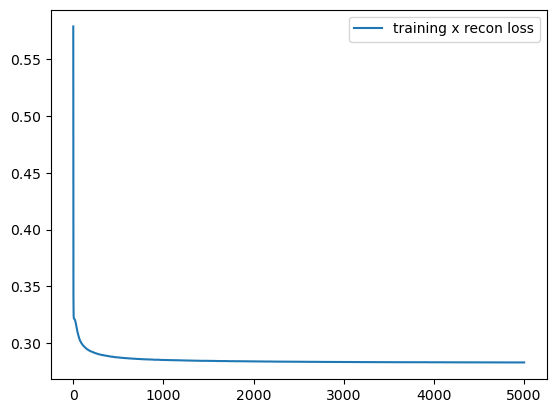

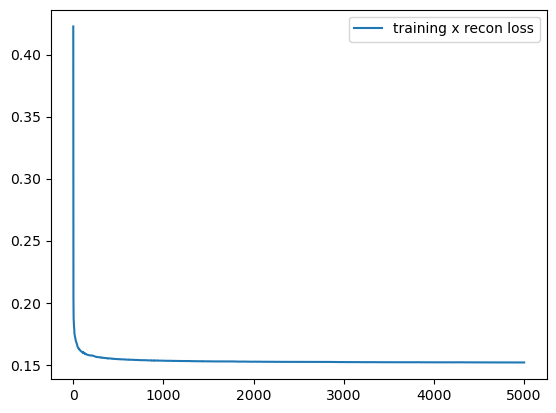

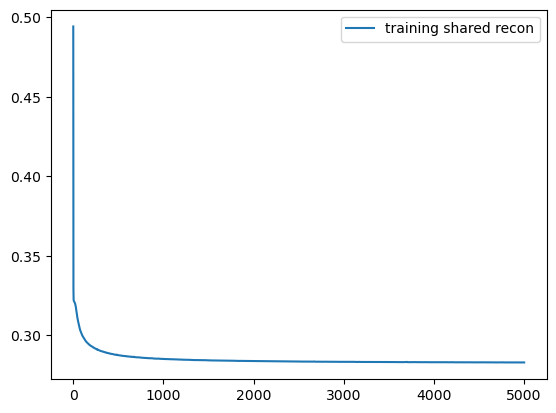

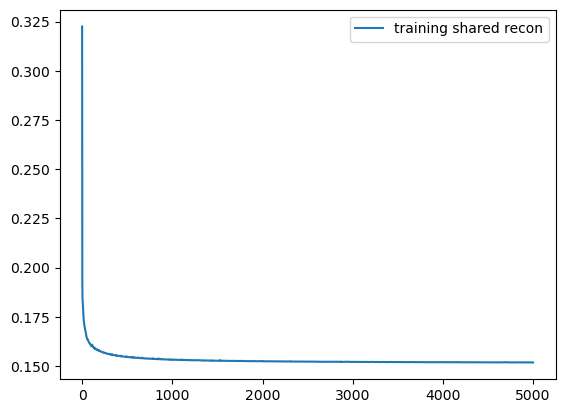

In [12]:

logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
if not os.path.exists(logsavepath_p_dna):
    os.mkdir(logsavepath_p_dna)
if not os.path.exists(modelsavepath_p_dna):
    os.mkdir(modelsavepath_p_dna)
if not os.path.exists(plotsavepath_p_dna):
    os.mkdir(plotsavepath_p_dna)

logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
plotsavepath_p_protein=os.path.join(plotsavepath_train,'protein')
if not os.path.exists(logsavepath_p_protein):
    os.mkdir(logsavepath_p_protein)
if not os.path.exists(modelsavepath_p_protein):
    os.mkdir(modelsavepath_p_protein)
if not os.path.exists(plotsavepath_p_protein):
    os.mkdir(plotsavepath_p_protein)



for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
        if os.path.exists(os.path.join(plotsavepath_p_dna,'loss_seed3_match'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg')):
            continue
#         if sIdx==0:
#             continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared

        loss_x=torch.nn.BCEWithLogitsLoss()

        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='cnn_vae_pbmc_lord':
            modelcnn_dna = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
            modelcnn_protein = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
            modelcnn_dnaShared=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size,applySigmoid=False)
            modelcnn_pShared=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size,applySigmoid=False)
        modelcnn_dna=modelcnn_dna
        modelcnn_protein=modelcnn_protein
        modelcnn_dnaShared=modelcnn_dnaShared
        modelcnn_pShared=modelcnn_pShared
        modelcnn_dna.cuda()
        modelcnn_protein.cuda()
        modelcnn_dnaShared.cuda()
        modelcnn_pShared.cuda()

        optimizer_dna = torch.optim.Adam(modelcnn_dna.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_protein = torch.optim.Adam(modelcnn_protein.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_dnaShared = torch.optim.Adam(modelcnn_dnaShared.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_pShared = torch.optim.Adam(modelcnn_pShared.parameters(), lr=lr_decoder, weight_decay=weight_decay)

        train_loss=[np.inf]*(epochs)
        train_loss_x_dna=[np.inf]*(epochs)
        train_loss_xShared_dna=[np.inf]*(epochs)

        train_loss_x_protein=[np.inf]*(epochs)
        train_loss_xShared_protein=[np.inf]*(epochs)
        
        train_lNorm=[np.inf]*(epochs)
        train_lNorm_dna=[np.inf]*(epochs)
        train_lNorm_protein=[np.inf]*(epochs)

        t_ep=time.time()

        stateDict_train_dna={}
        stateDict_train_protein={}
        stateDict_train_dnaShared={}
        stateDict_train_proteinShared={}
        
        
        latent_shared=torch.nn.Embedding(proteinNames.size,currLatentSize)
        latent_protein=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        latent_dna=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        pIDemb=torch.nn.Embedding(nProt, pIDemb_size).cuda()
        optimizer_latent= torch.optim.Adam([latent_shared.weight,latent_protein.weight,latent_dna.weight,pIDemb.weight], lr=lr_latent, weight_decay=weight_decay)


#         epCounts=0
        for ep in range(epochs):
            train_loss[ep],train_loss_x_dna[ep],train_loss_x_protein[ep],train_loss_xShared_dna[ep],train_loss_xShared_protein[ep],train_lNorm[ep],train_lNorm_dna[ep],train_lNorm_protein[ep]=train(ep)

#             if ep>200 and (val_loss_x_dna[ep]>=val_loss_x_dna[ep-200] or val_loss_x_protein[ep]>=val_loss_x_protein[ep-200]):
#                 epCounts+=1
#             else:
#                 epCounts=0

#             if epCounts>100:
#                 break


            if ep%saveFreq == (saveFreq-1):
                stateDict_train_dna[ep]=modelcnn_dna.cpu().state_dict()
                stateDict_train_protein[ep]=modelcnn_protein.cpu().state_dict()
                stateDict_train_dnaShared[ep]=modelcnn_dnaShared.cpu().state_dict()
                stateDict_train_proteinShared[ep]=modelcnn_pShared.cpu().state_dict()
                with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_dna.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(latent_protein.weight, output, pickle.HIGHEST_PROTOCOL)
                with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(ep)), 'wb') as output:
                    pickle.dump(pIDemb.weight, output, pickle.HIGHEST_PROTOCOL)


            modelcnn_dna.cuda()
            modelcnn_protein.cuda()
            modelcnn_dnaShared.cuda()
            modelcnn_pShared.cuda()
            torch.cuda.empty_cache()
        print(' total time: {:.4f}s'.format(time.time() - t_ep))

        with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_dna,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_dnaShared, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(stateDict_train_proteinShared, output, pickle.HIGHEST_PROTOCOL)
        

        with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_xShared_dna, output, pickle.HIGHEST_PROTOCOL)


        with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_protein,'train_loss_xShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'wb') as output:
            pickle.dump(train_loss_xShared_protein, output, pickle.HIGHEST_PROTOCOL)
            
        with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)), 'wb') as output:
            pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


        plt.plot(np.arange(epochs),train_loss_x_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()


        plt.plot(np.arange(epochs),train_loss_x_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()

        plt.plot(np.arange(epochs),train_loss_xShared_dna)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training shared recon','validation shared recon'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()

        plt.plot(np.arange(epochs),train_loss_xShared_protein)
        # plt.plot(np.arange(epochs),train_loss_kl_ep)
        plt.legend(['training shared recon','validation shared recon'],loc='upper right')
        plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed3_xShared'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
        plt.show()










In [21]:
logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)), 'rb') as output:
    train_lNorm=pickle.load(output)
with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)), 'rb') as output:
    train_lNorm_dna=pickle.load(output)
with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)), 'rb') as output:
    train_lNorm_protein=pickle.load(output)

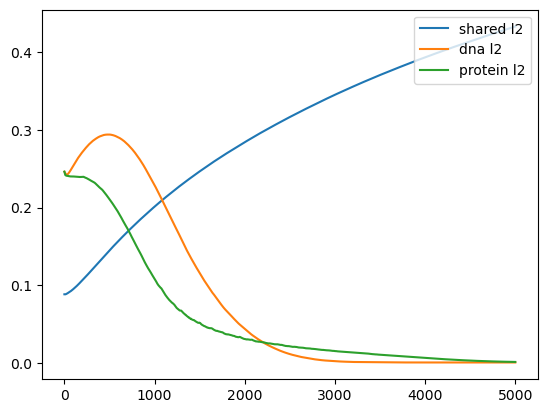

In [22]:
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
plt.plot(np.arange(epochs),train_lNorm)
plt.plot(np.arange(epochs),train_lNorm_dna)
plt.plot(np.arange(epochs),train_lNorm_protein)
plt.legend(['shared l2','dna l2','protein l2'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed3_lNorm'+str(currLatentSize)+'_'+str(dSpecificSize)+'.jpg'))
plt.show()

In [14]:
loadEpoch='3399'
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
#         if sIdx==0:
#             continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared


        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='cnn_vae_pbmc_lord':
            modelcnn_dna_dec = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
            modelcnn_protein_dec = model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,pIDemb_size,applySigmoid=False)
            modelcnn_dnaShared_dec=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size,applySigmoid=False)
            modelcnn_pShared_dec=model.model_cnnvae_conditional.CNN_VAE_decode_pIDemb(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize,pIDemb_size,applySigmoid=False)
        modelcnn_dna_dec.cuda().eval()
        modelcnn_protein_dec.cuda().eval()
        modelcnn_dnaShared_dec.cuda().eval()
        modelcnn_pShared_dec.cuda().eval()
        
        latent_shared_dec=torch.nn.Embedding(proteinNames.size,currLatentSize)
        
        latent_protein_dec=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        latent_dna_dec=torch.nn.Embedding(proteinNames.size,dSpecificSize)
        pIDemb_dec=torch.nn.Embedding(nProt, pIDemb_size).cuda()

        
        if loadEpoch is not None:
            with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(loadEpoch)), 'rb') as output:
                latent_dna_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(loadEpoch)), 'rb') as output:
                latent_shared_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(loadEpoch)), 'rb') as output:
                latent_protein_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'pIDemb_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(loadEpoch)), 'rb') as output:
                pIDemb_dec.weight=pickle.load(output)
            
            with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'rb') as output:
                stateDict_train_dna_dec=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'rb') as output:
                stateDict_train_protein_dec=pickle.load(output)
            with open(os.path.join(modelsavepath_p_dna,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'rb') as output:
                stateDict_train_dnaShared_dec=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'stateDictShared_'+str(currLatentSize)+'_'+str(dSpecificSize)), 'rb') as output:
                stateDict_train_proteinShared_dec=pickle.load(output)

            modelcnn_dna_dec.load_state_dict(stateDict_train_dna_dec[int(loadEpoch)])
            modelcnn_dnaShared_dec.load_state_dict(stateDict_train_dnaShared_dec[int(loadEpoch)])
            modelcnn_protein_dec.load_state_dict(stateDict_train_protein_dec[int(loadEpoch)])
            modelcnn_pShared_dec.load_state_dict(stateDict_train_proteinShared_dec[int(loadEpoch)])
        latent_shared_dec.weight.requires_grad=False
        
        latent_protein_dec.weight.requires_grad=False
        latent_dna_dec.weight.requires_grad=False
        pIDemb_dec.weight.requires_grad=False

128
16


In [17]:
with torch.no_grad():
    i=0
    trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
    traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
    trainIdx_i=torch.tensor(trainIdx_i)
    traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
    trainInput_ID=plabels[trainIdx_i].cuda()
    trainInput_shared=latent_shared_dec(trainIdx_i).cuda().float()
    trainInput_dna=latent_dna_dec(trainIdx_i).cuda().float()
    trainInput_protein=latent_protein_dec(trainIdx_i).cuda().float()
    #         print(trainInput.shape)


    recon_dna= modelcnn_dna_dec(torch.cat((trainInput_shared,trainInput_dna),dim=1),pIDemb_dec(trainInput_ID))
    reconShared_dna=modelcnn_dnaShared_dec(trainInput_shared,pIDemb_dec(trainInput_ID))
    recon_protein= modelcnn_protein_dec(torch.cat((trainInput_shared,trainInput_protein),dim=1),pIDemb_dec(trainInput_ID))
    reconShared_protein=modelcnn_pShared_dec(trainInput_shared,pIDemb_dec(trainInput_ID))

0


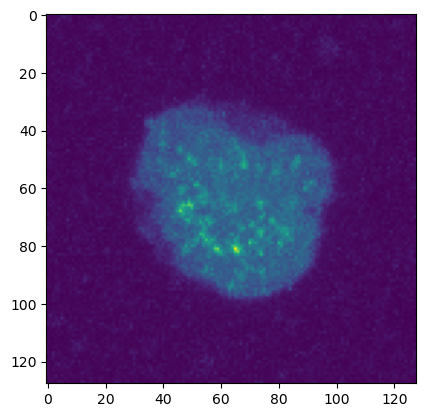

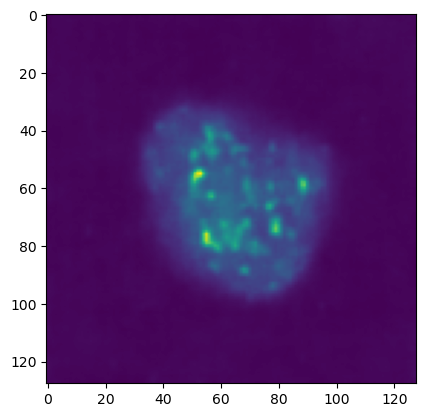

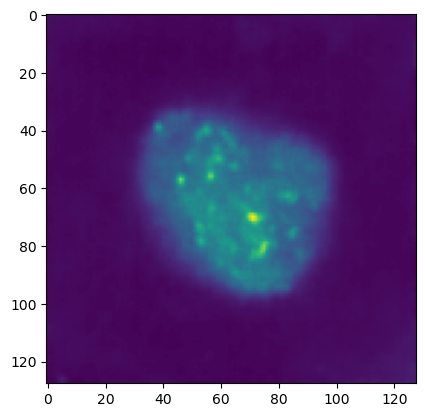

1


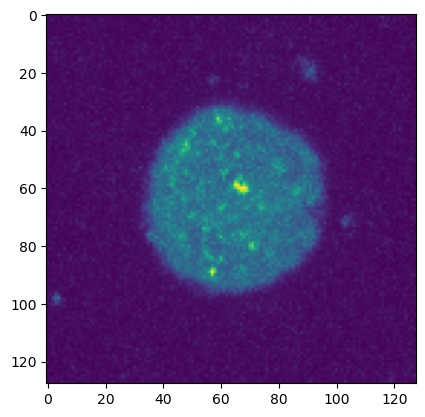

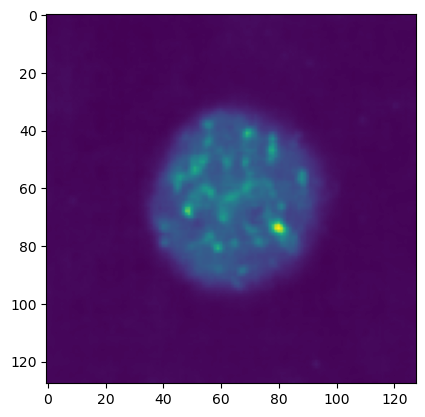

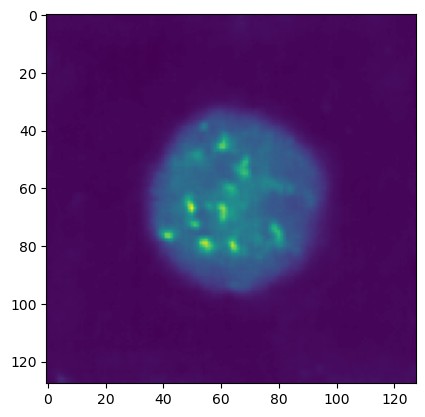

2


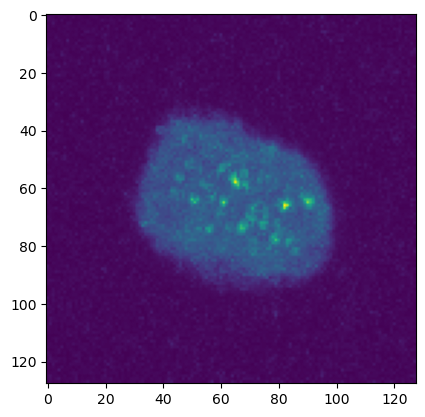

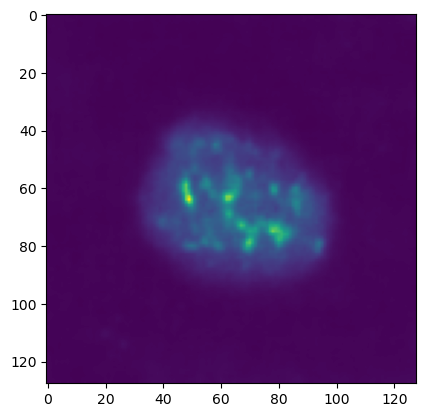

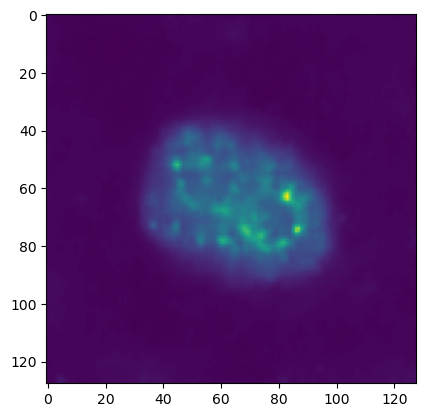

3


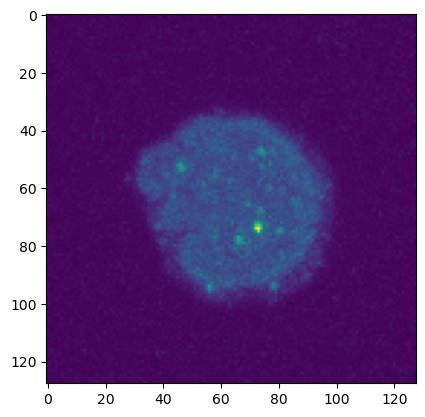

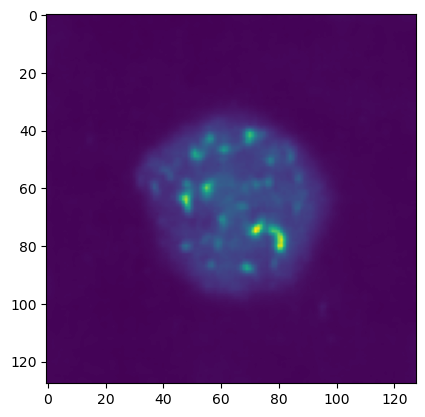

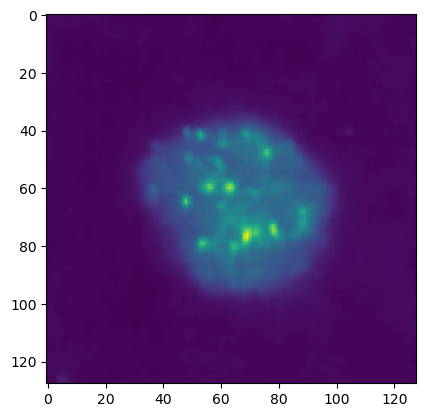

4


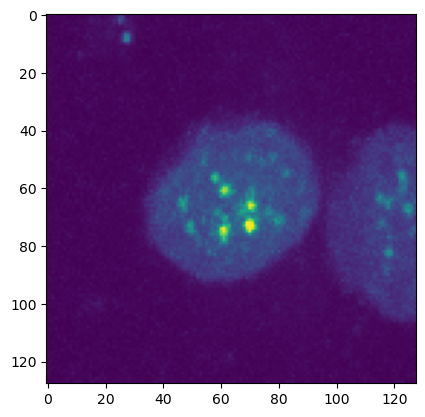

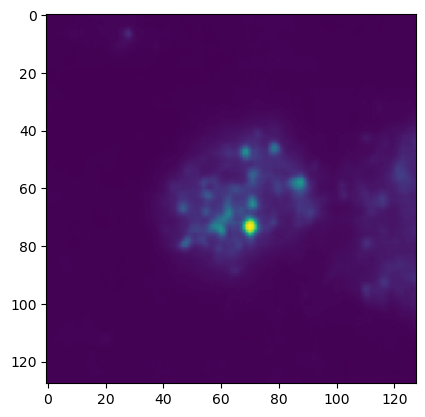

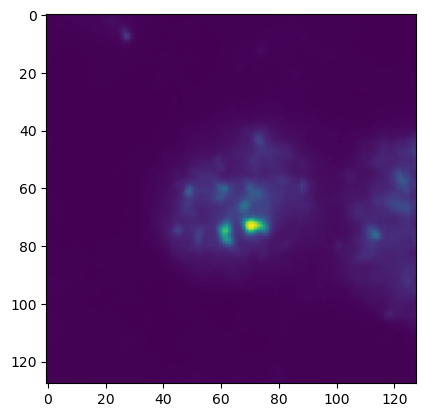

5


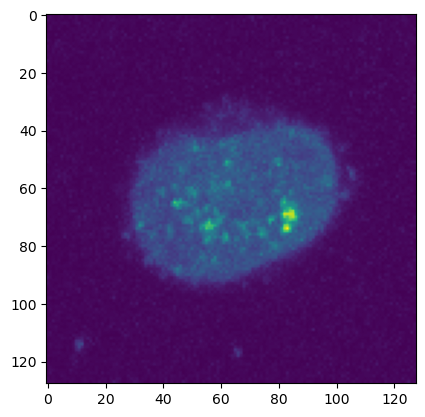

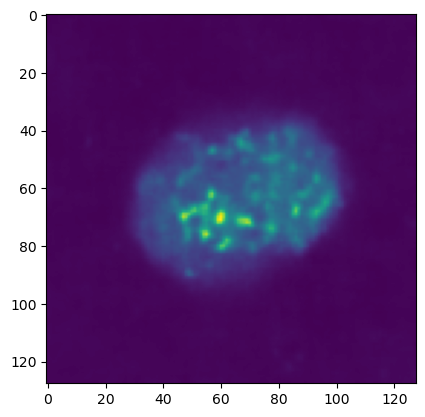

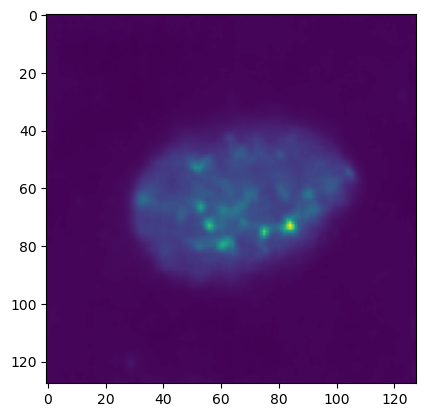

6


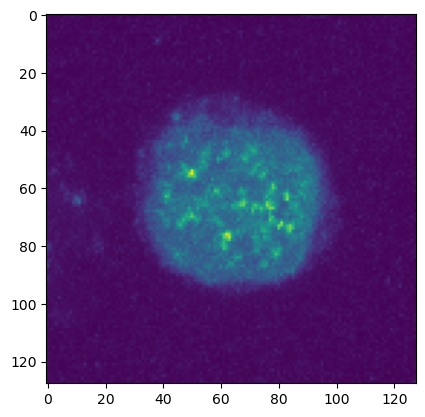

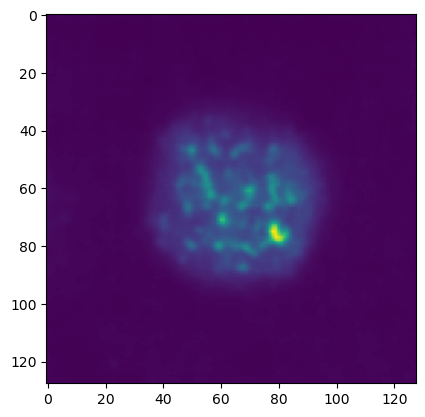

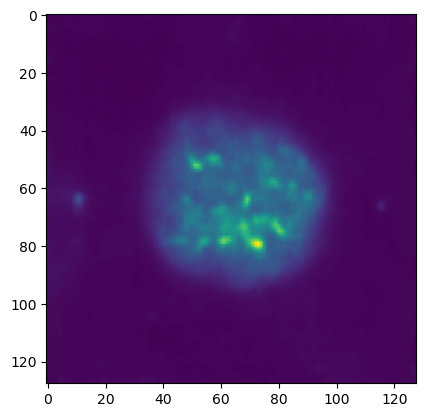

7


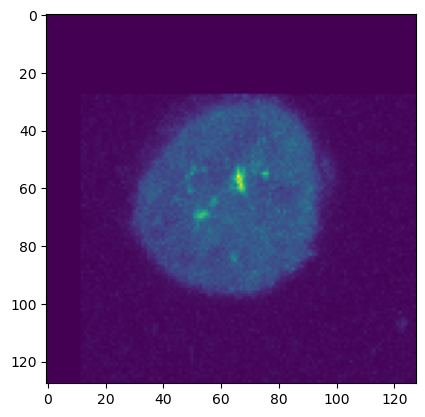

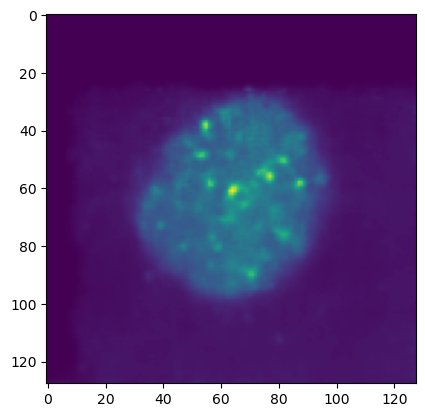

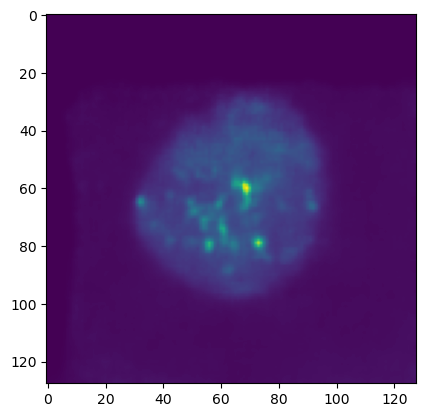

8


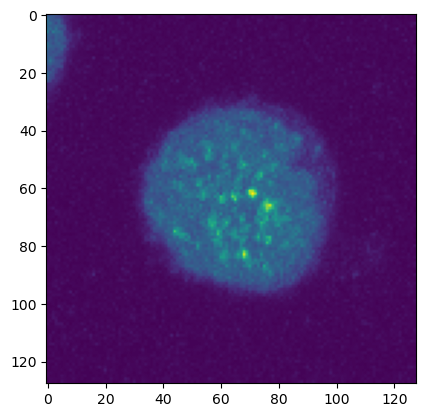

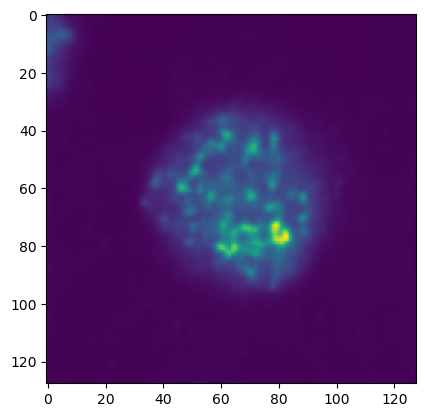

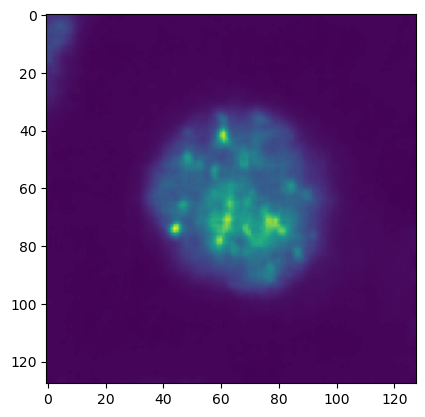

9


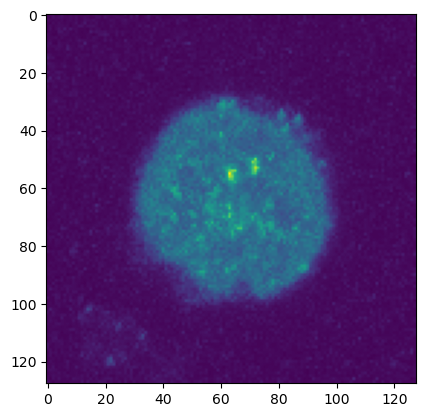

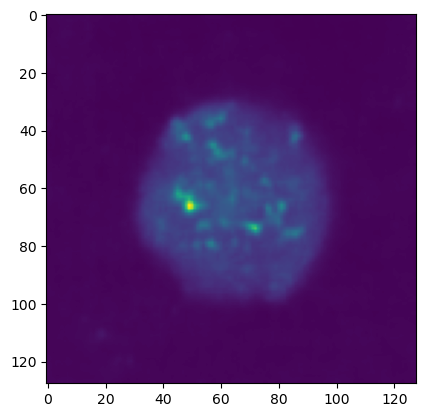

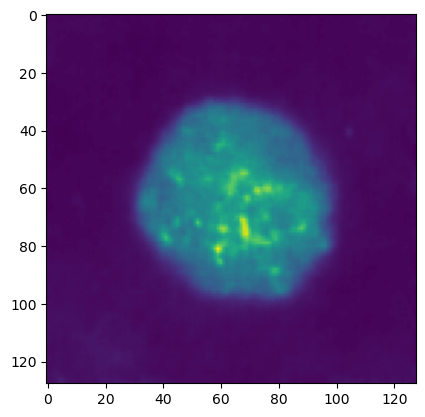

10


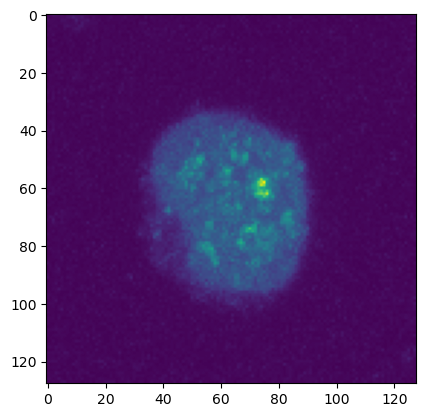

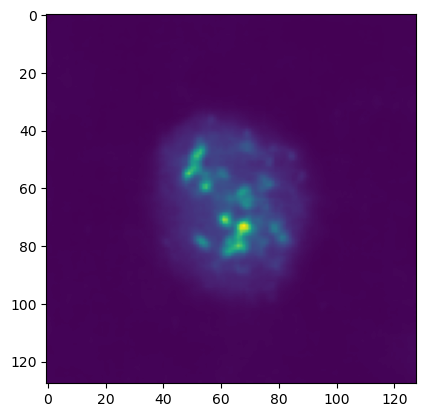

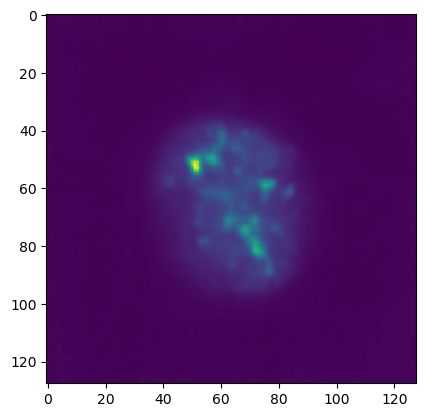

11


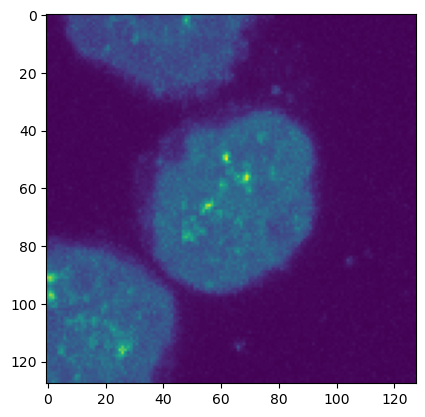

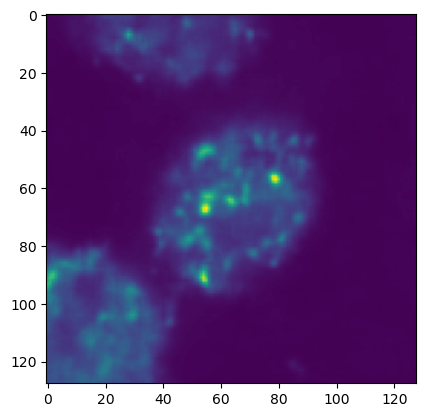

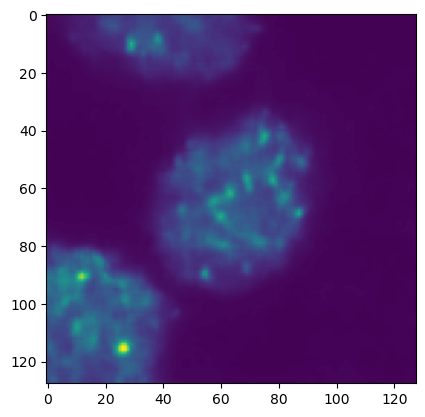

12


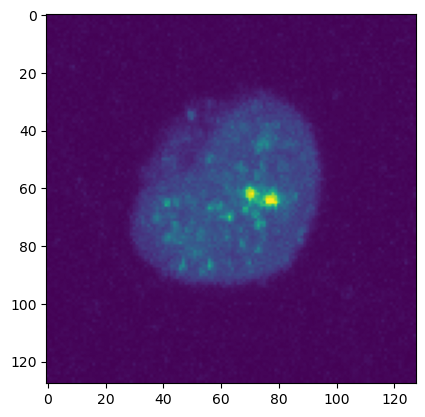

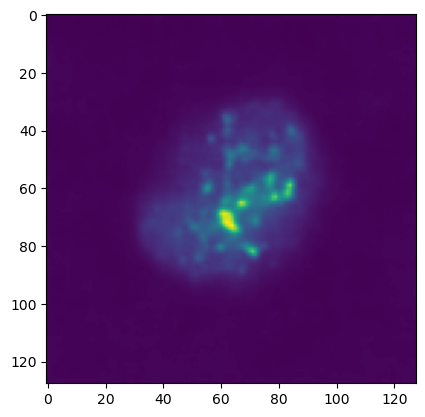

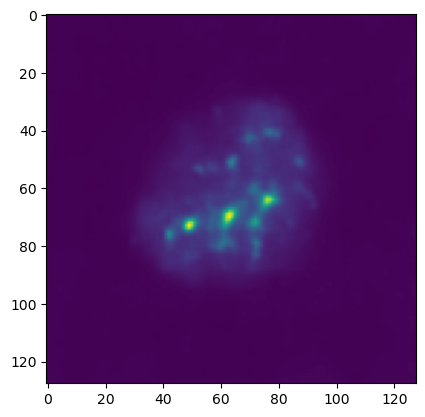

13


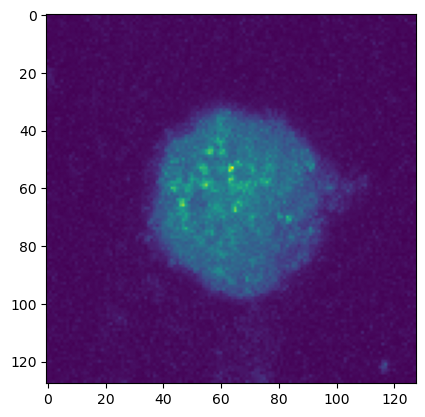

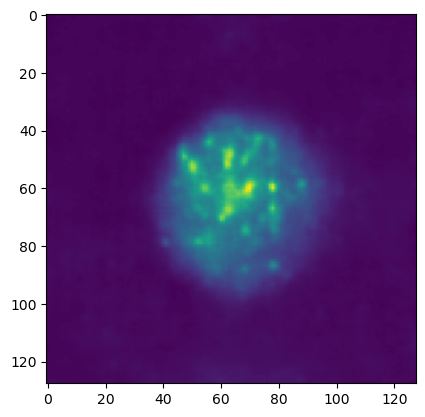

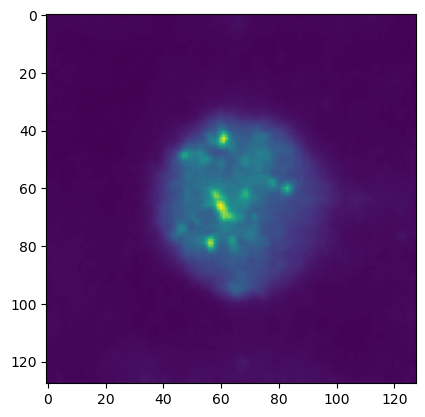

14


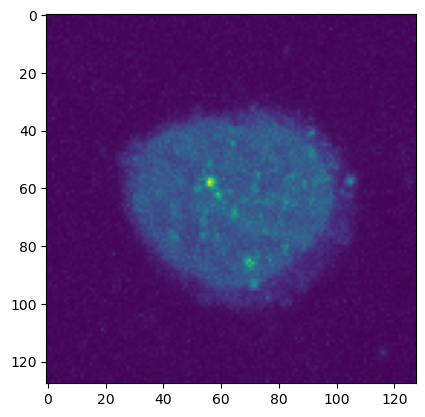

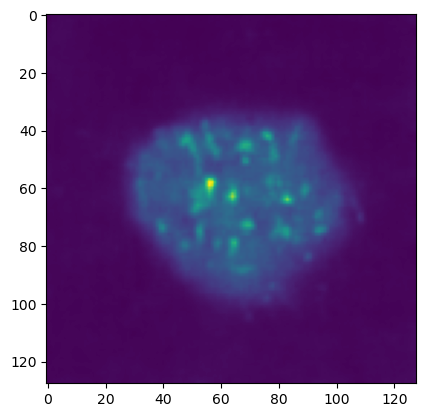

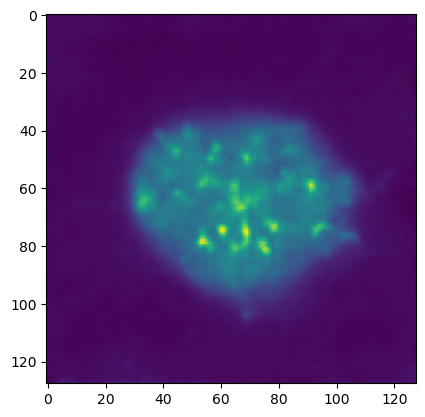

15


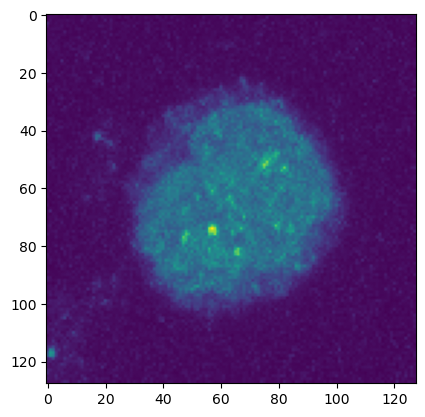

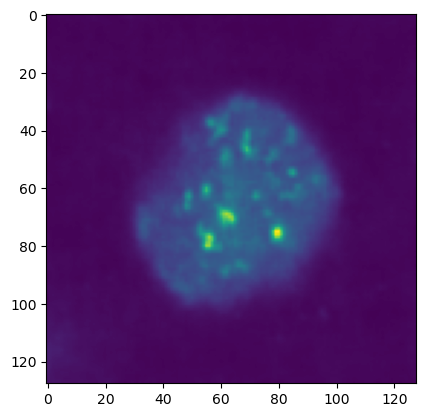

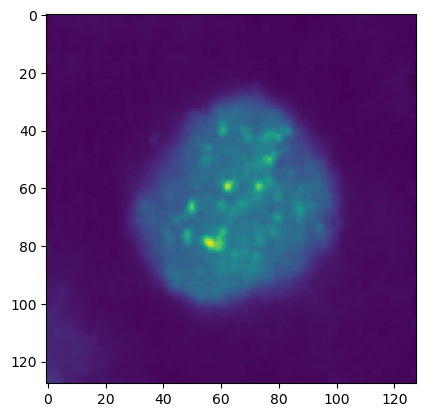

16


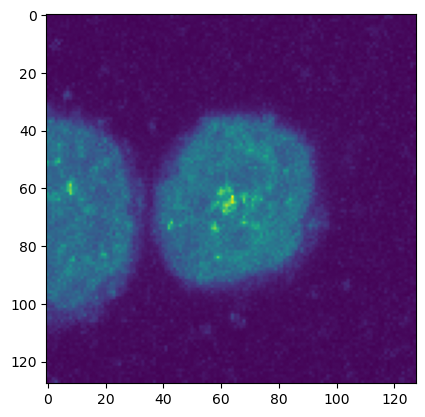

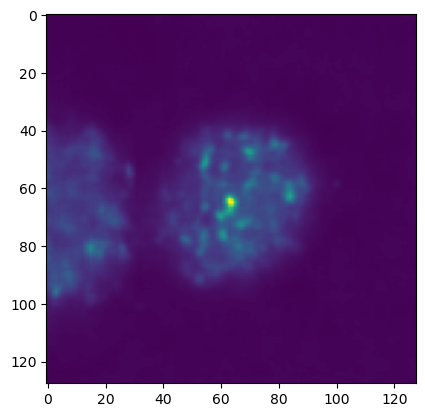

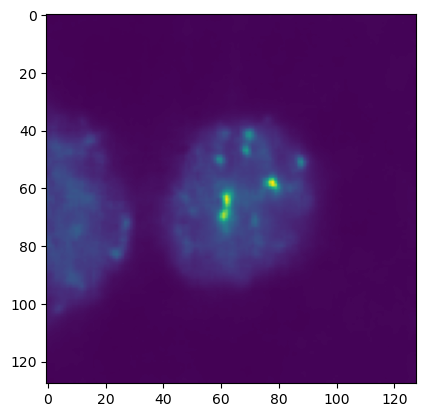

17


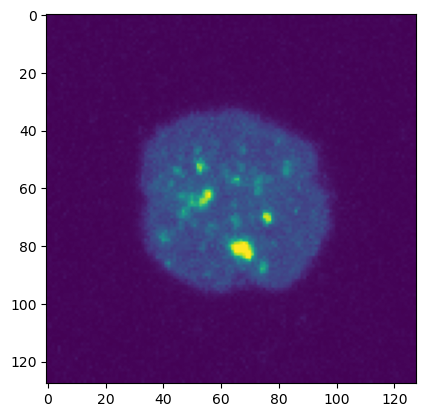

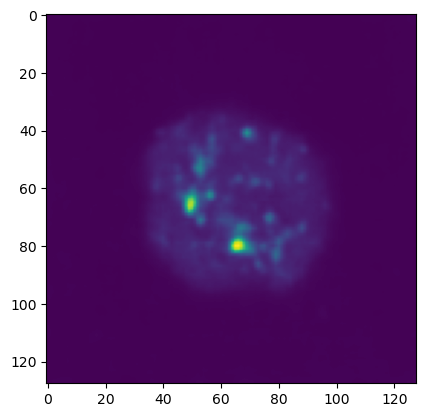

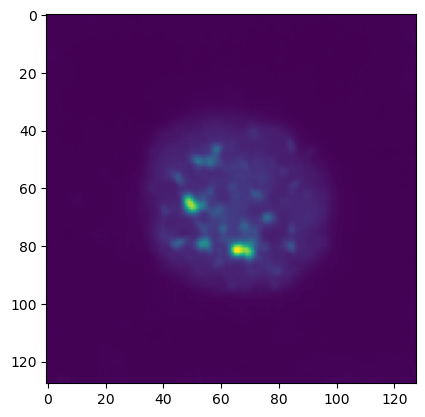

18


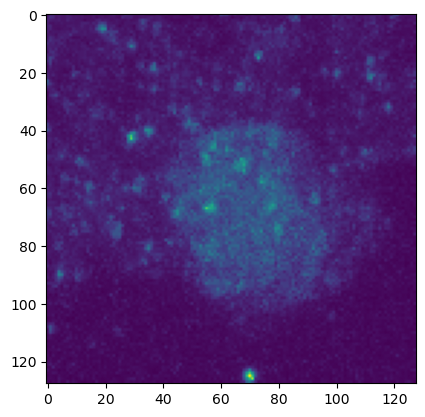

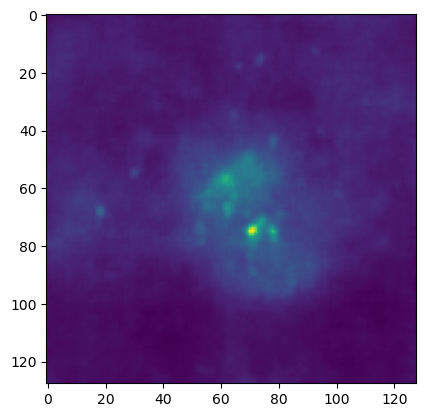

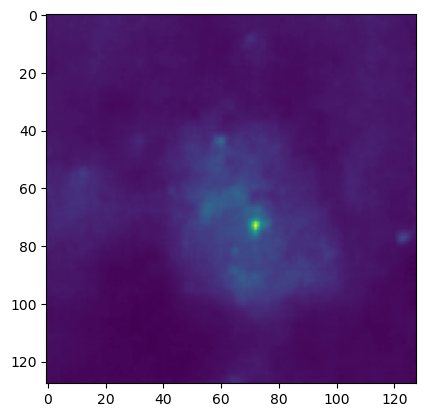

19


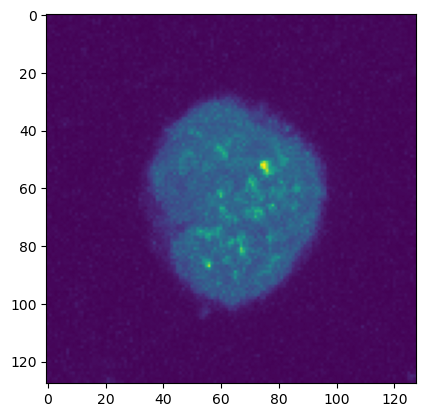

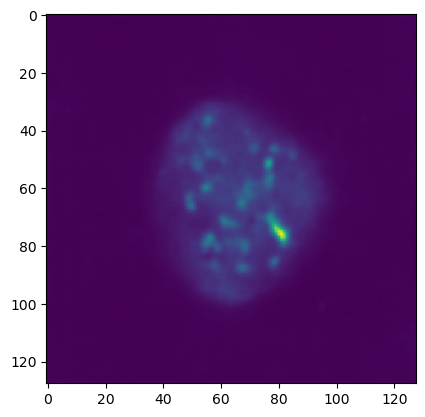

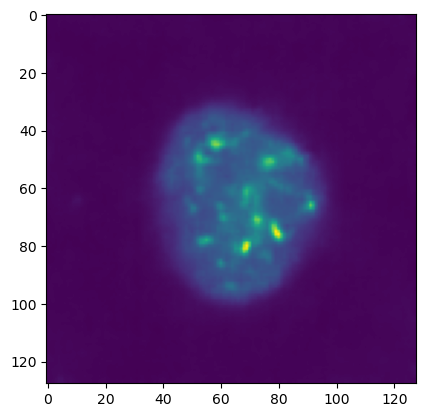

In [18]:
sigmoid=torch.nn.Sigmoid()
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_protein[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(reconShared_protein[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_protein[i][0]).cpu().detach().numpy())
    plt.show()

0


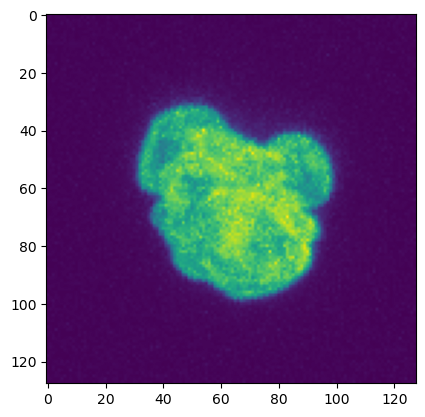

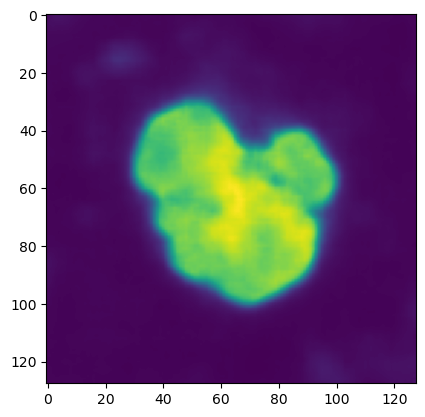

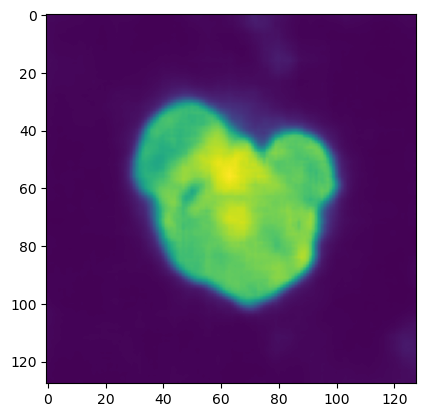

1


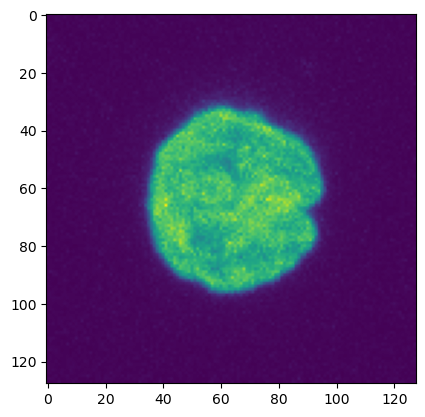

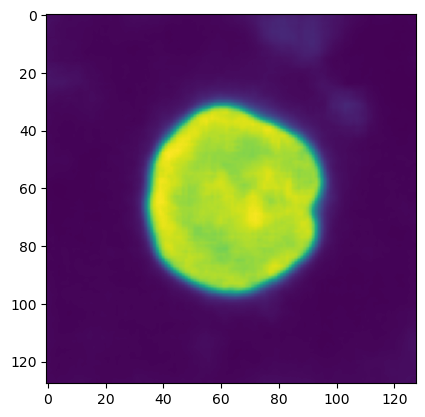

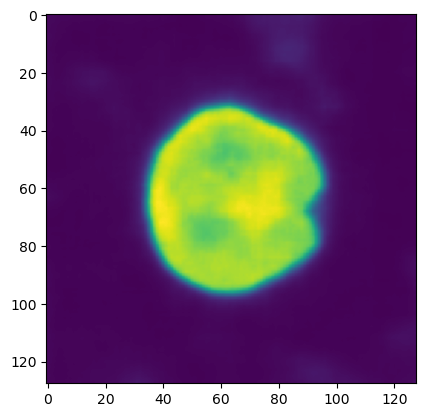

2


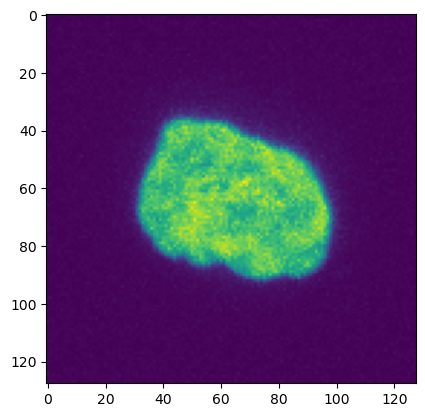

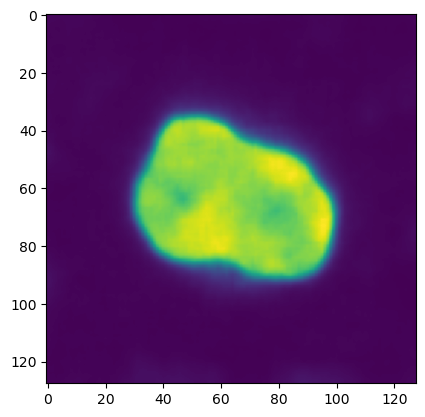

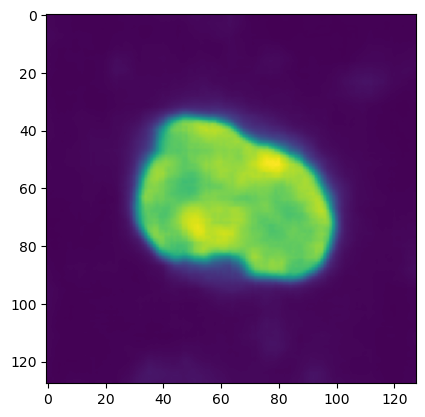

3


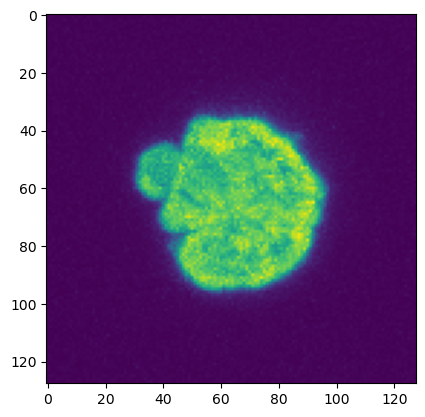

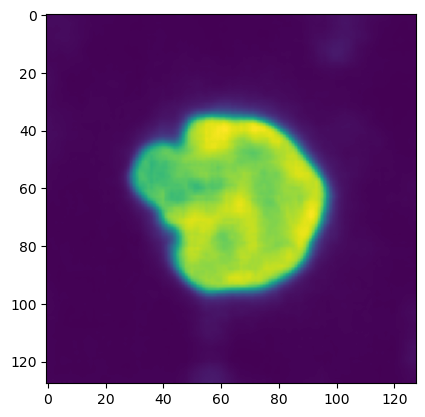

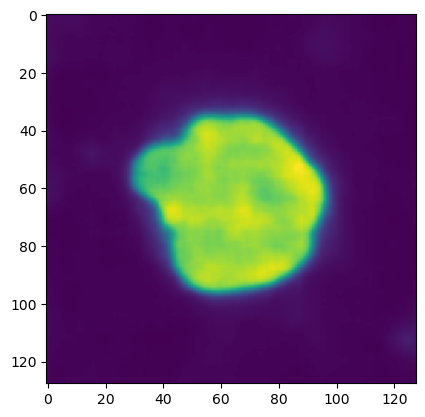

4


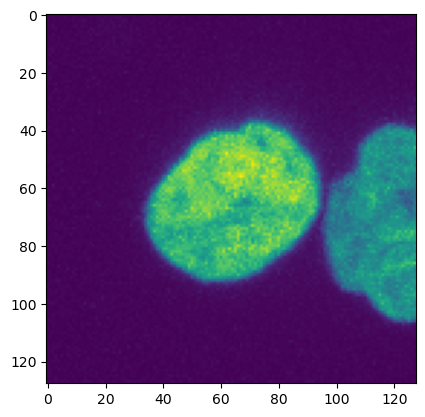

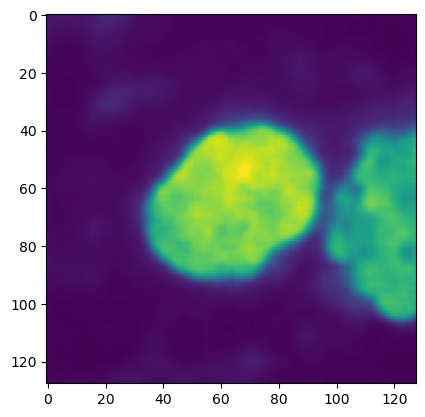

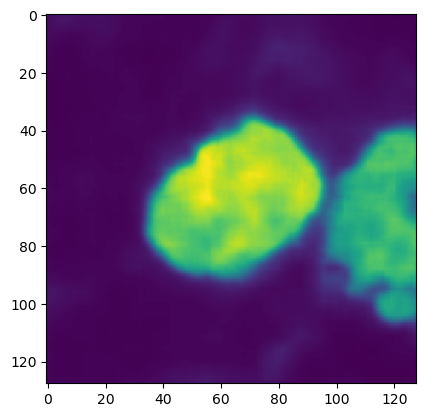

5


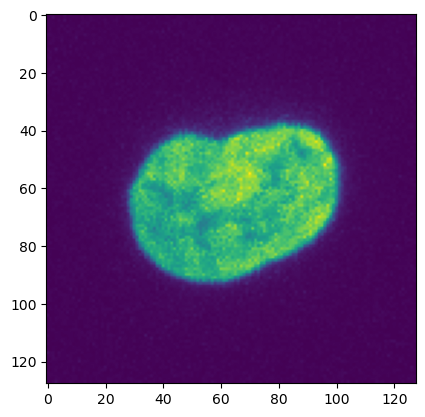

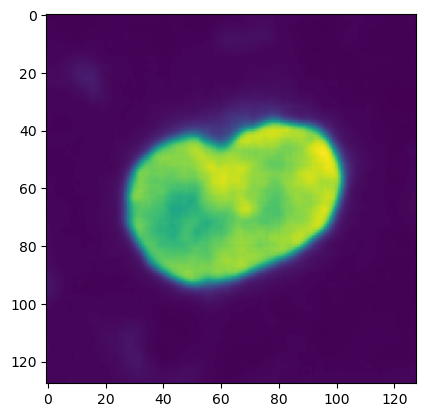

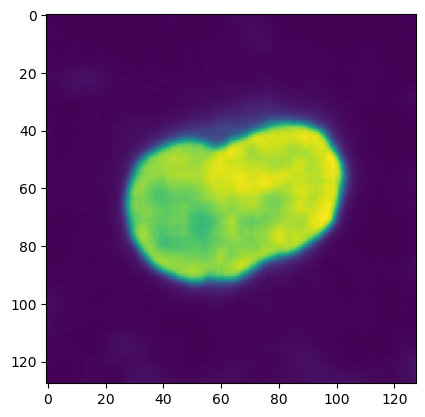

6


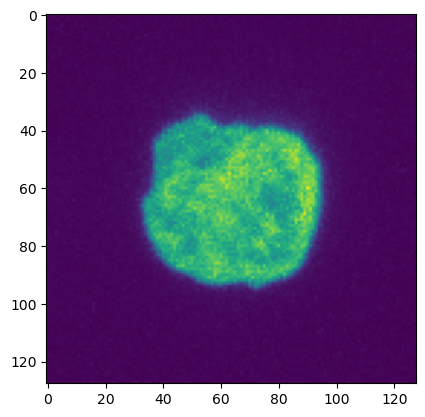

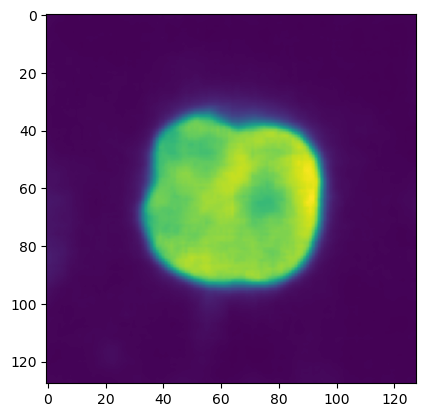

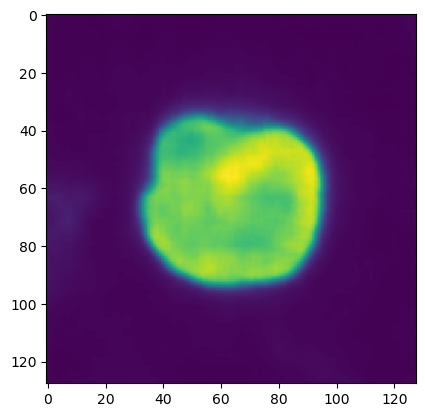

7


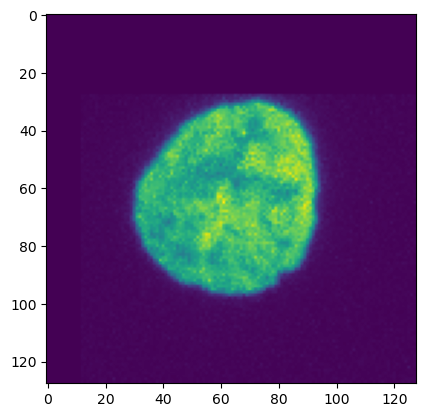

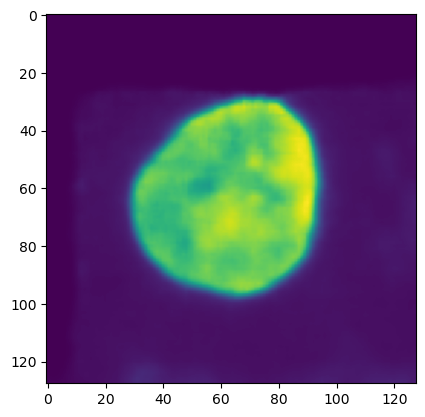

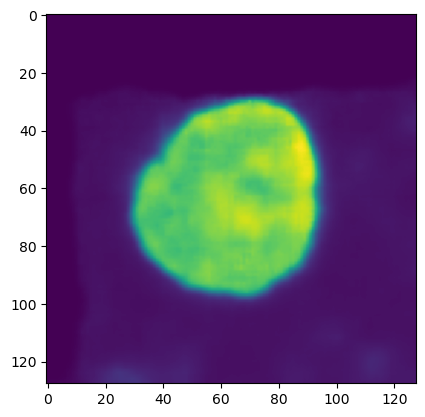

8


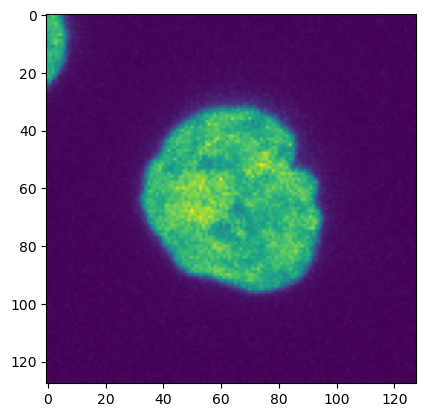

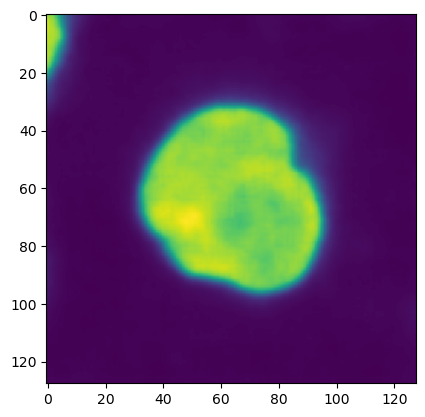

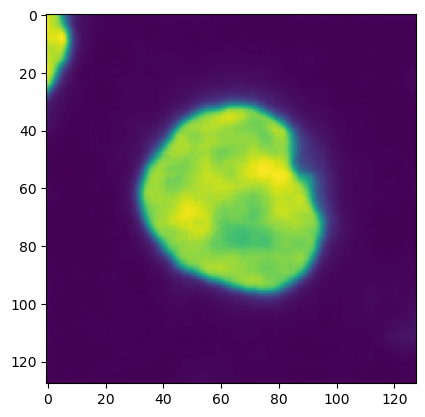

9


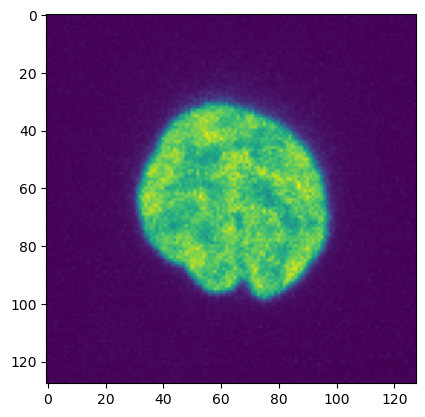

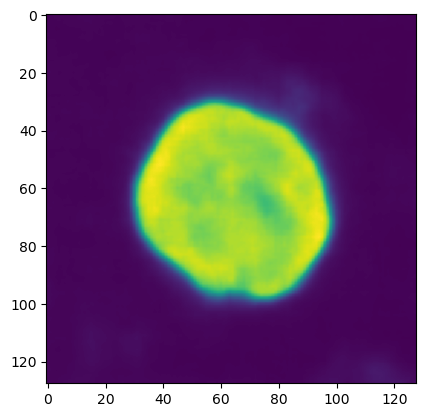

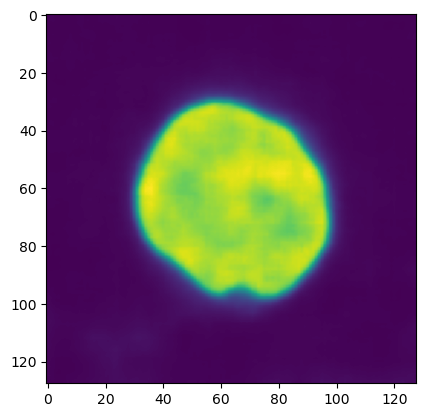

10


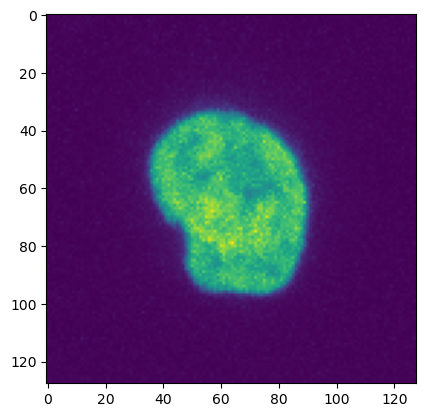

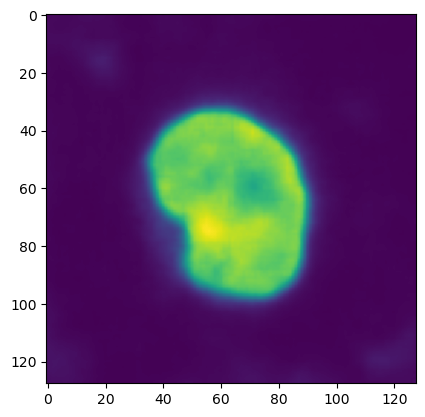

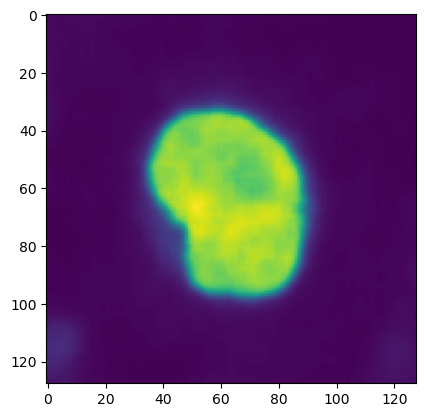

11


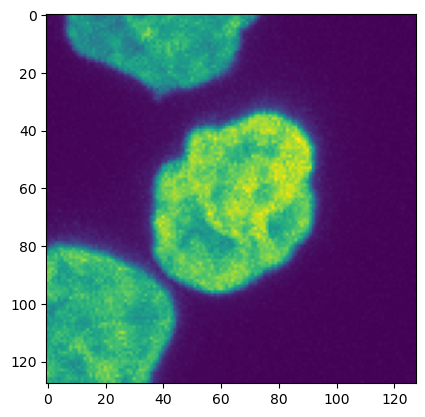

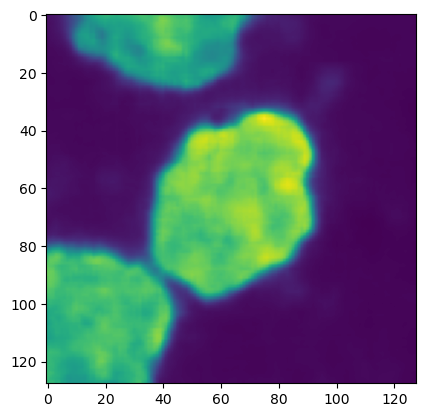

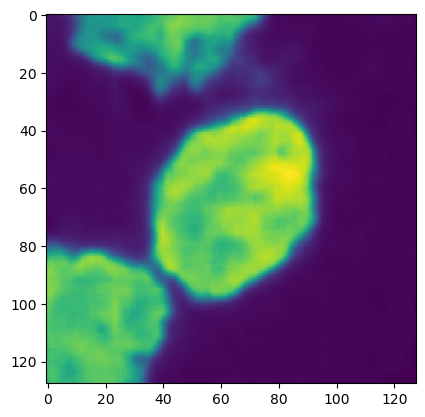

12


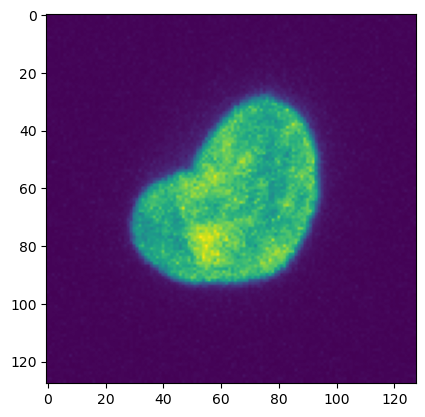

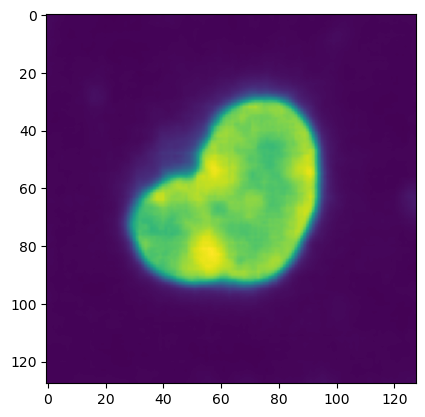

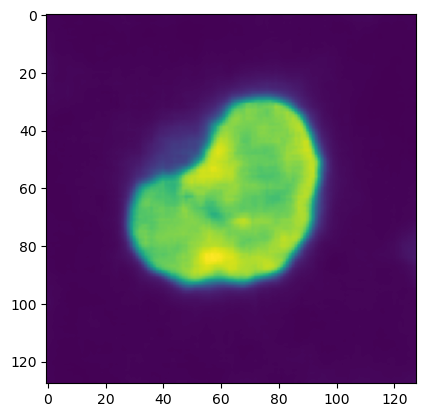

13


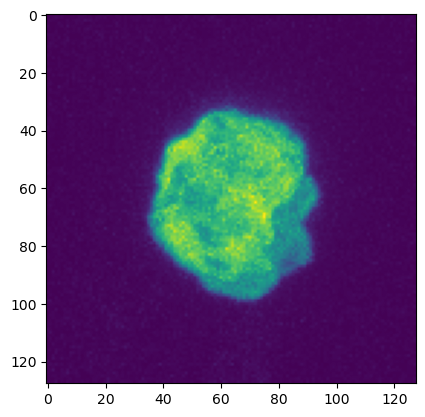

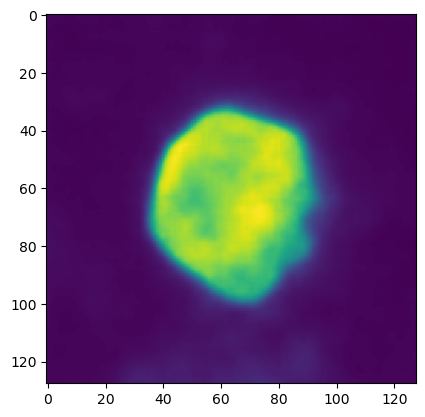

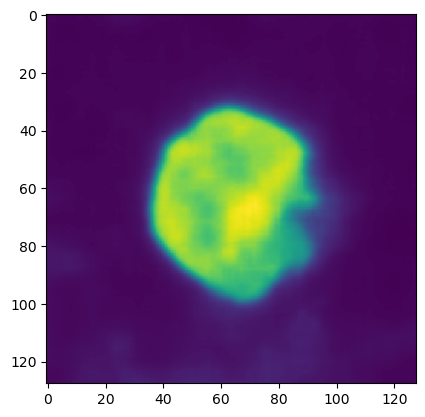

14


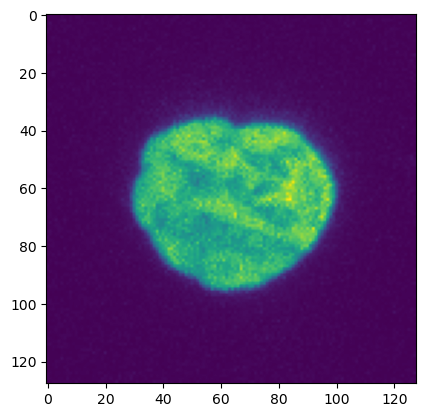

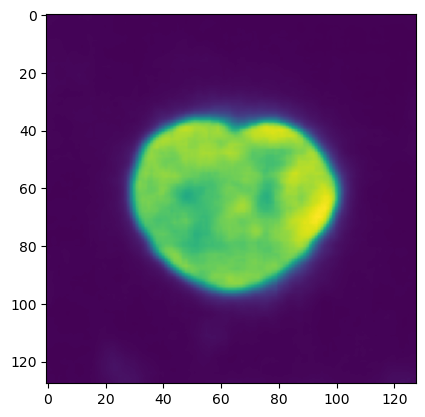

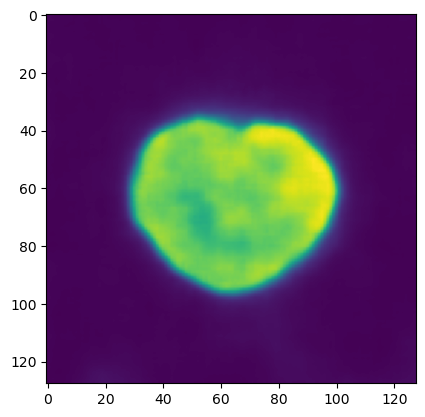

15


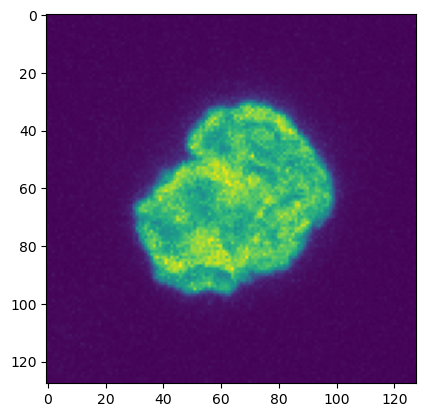

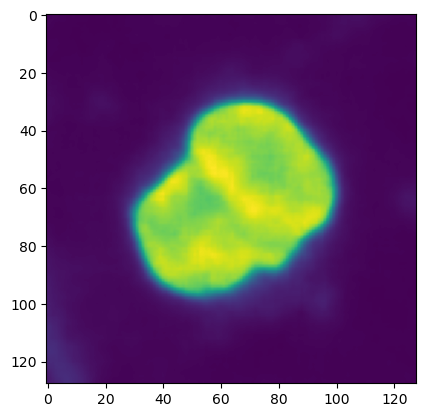

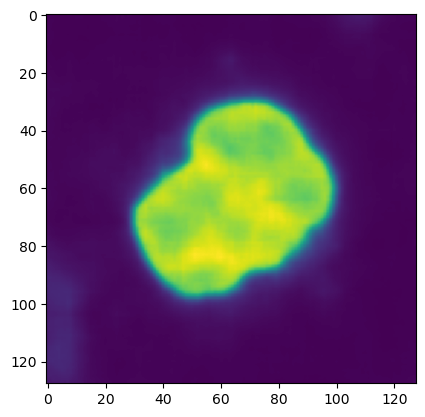

16


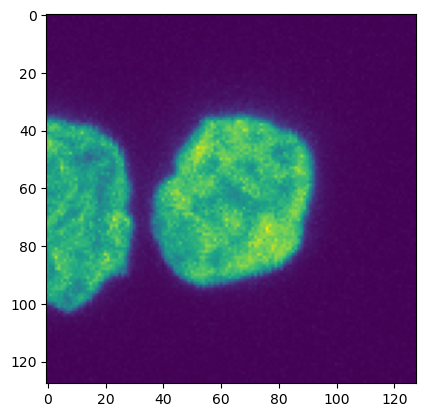

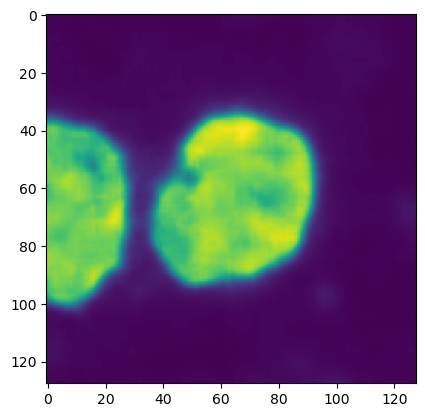

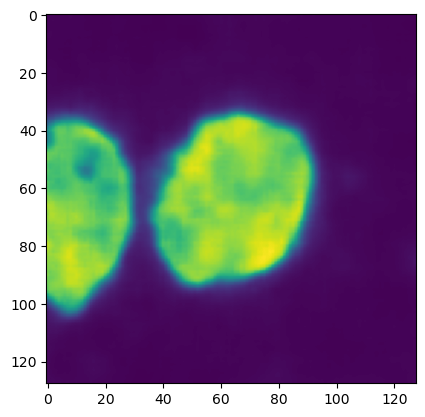

17


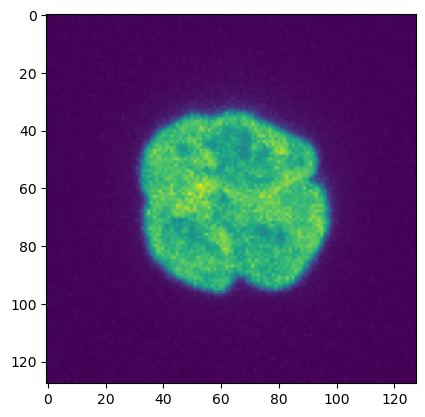

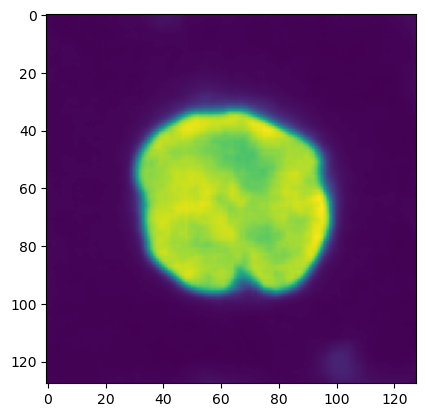

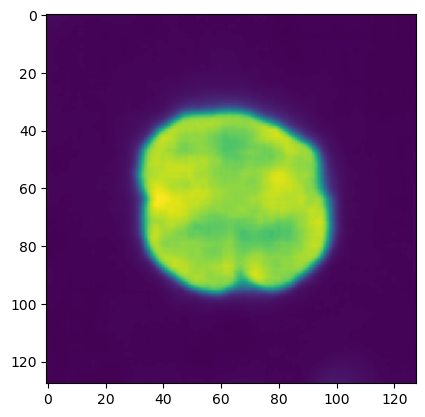

18


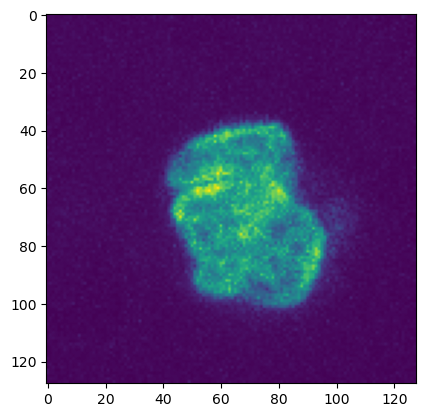

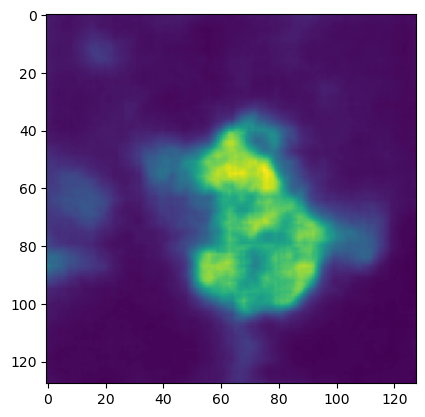

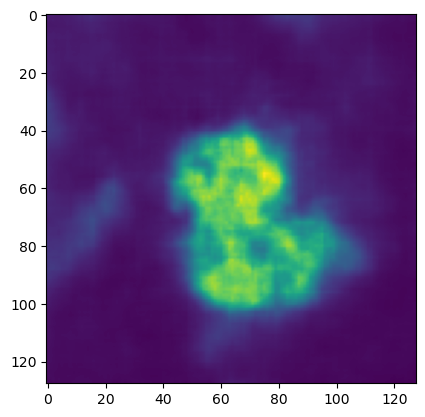

19


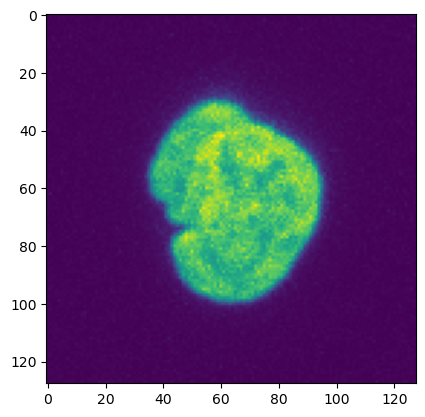

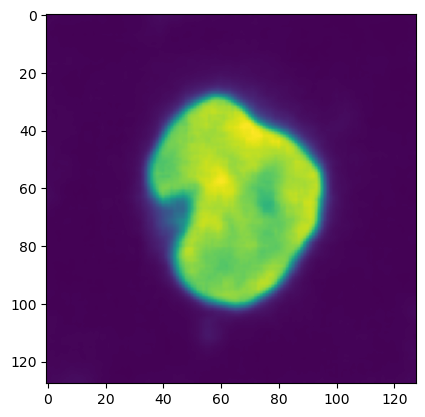

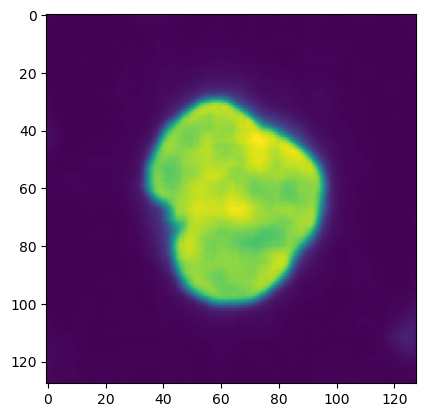

In [19]:
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_dna[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(reconShared_dna[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_dna[i][0]).cpu().detach().numpy())
    plt.show()